In [6]:
!pip install --upgrade pip setuptools wheel

     |████████████████████████████████| 952 kB 14.0 MB/s            
  Attempting uninstall: wheel
    Found existing installation: wheel 0.34.2
    Uninstalling wheel-0.34.2:
      Successfully uninstalled wheel-0.34.2
  Attempting uninstall: setuptools
    Found existing installation: setuptools 45.2.0
    Uninstalling setuptools-45.2.0:
      Successfully uninstalled setuptools-45.2.0


In [7]:
!pip install --upgrade pip

In [8]:
!pip install albumentations

  Using cached albumentations-1.3.0-py3-none-any.whl (123 kB)
  Using cached opencv-python-headless-4.7.0.68.tar.gz (91.1 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached qudida-0.0.4-py3-none-any.whl (3.5 kB)
  Created wheel for opencv-python-headless: filename=opencv_python_headless-4.7.0.68-cp36-cp36m-linux_x86_64.whl size=29247936 sha256=8101d1539dda6ee2ea45732035d8562e6a0f4399bc9f96fe4552cd1693b08888
  Stored in directory: /home/pamessina/.cache/pip/wheels/40/32/12/7375f7b8e8290fe0e76391cc7d0b32504570ca4b1ba55b9510
Successfully built opencv-python-headless


In [19]:
import random

import cv2
from matplotlib import pyplot as plt

import albumentations as A

In [20]:
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White


def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2, text_thickness=3):
    """Visualizes a single bounding box on the image"""    
    x_min, y_min, x_max, y_max = bbox[0], bbox[1], bbox[2], bbox[3]
    x_min *= img.shape[1]
    x_max *= img.shape[1]
    y_min *= img.shape[0]
    y_max *= img.shape[0]
    w = x_max - x_min
    h = y_max - y_min
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
   
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)    
    
    ax = 4000
    ay = 2
    bx = 256
    by = 0.25
    m = (by - ay) / (bx - ax)
    n = ay - m * ax
    font_scale = m * (img.shape[0] + img.shape[1]) * 0.5 + n
#     print('font_scale =', font_scale, (img.shape[0] + img.shape[1]) * 0.5)
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, font_scale, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
#     cv2.putText(
#         img,
#         text=class_name,
#         org=(x_min, y_min - int(0.3 * text_height)),
#         fontFace=cv2.FONT_HERSHEY_SIMPLEX,
#         fontScale=2, 
#         color=TEXT_COLOR, 
#         lineType=2,
#     )

#     ax = 4000
#     ay = 3
#     bx = 256
#     by = 0.5
#     m = (by - ay) / (bx - ax)
#     n = ay - m * ax
#     thickness = m * (img.shape[0] + img.shape[1]) * 0.5 + n

    cv2.putText(img, class_name, (x_min, y_min - int(0.3 * text_height)), cv2.FONT_HERSHEY_SIMPLEX, font_scale, TEXT_COLOR, text_thickness)
    return img


def visualize(image, bboxes, category_ids, category_id_to_name, figsize=(12, 12), thickness=2, text_thickness=3):
    img = image.copy()
    print(image.shape)
    print(img.shape)
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name, thickness=thickness, text_thickness=text_thickness)
    plt.figure(figsize=figsize)
    plt.axis('off')
    plt.imshow(img)

In [10]:
image_path = '/mnt/data/mimic-cxr-jpg/images/p15/p15528228/s53078415/157febc5-ee2b7092-93d96d3d-3b125ac7-7e7795a0.jpg'

In [11]:
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [12]:
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import load_chest_imagenome_silver_bboxes
from medvqa.datasets.chest_imagenome import CHEST_IMAGENOME_BBOX_NAMES
import imagesize

In [13]:
bboxes_dict = load_chest_imagenome_silver_bboxes()

In [15]:
dicom_id = '157febc5-ee2b7092-93d96d3d-3b125ac7-7e7795a0'
bboxes_dict[dicom_id]

{'coords': array([0.08569182, 0.10242146, 0.4933176 , 0.77650523, 0.13404088,
        0.125     , 0.4933176 , 0.375     , 0.11792453, 0.375     ,
        0.4610849 , 0.5222513 , 0.08569182, 0.5222513 , 0.4504717 ,
        0.77650523, 0.2893082 , 0.3435864 , 0.47720125, 0.54908377,
        0.1875    , 0.10242146, 0.4933176 , 0.24541885, 0.03183962,
        0.7097513 , 0.13915095, 0.79908377, 0.35927674, 0.6158377 ,
        0.41273585, 0.72742146, 0.08569182, 0.638089  , 0.5200472 ,
        0.77650523, 0.5412736 , 0.09816754, 0.9009434 , 0.79908377,
        0.5412736 , 0.12041885, 0.884827  , 0.375     , 0.5412736 ,
        0.375     , 0.8899371 , 0.52650523, 0.5522799 , 0.52650523,
        0.9009434 , 0.79908377, 0.5412736 , 0.3435864 , 0.7130503 ,
        0.5533377 , 0.5467767 , 0.09816754, 0.8309748 , 0.24541885,
        0.8470912 , 0.7320026 , 0.9544025 , 0.8213351 , 0.5412736 ,
        0.6695026 , 0.9009434 , 0.79908377, 0.42334905, 0.03566754,
        0.5683962 , 0.4597513 , 0.4288

In [16]:
category_id_to_name = {i:name for i,name in enumerate(CHEST_IMAGENOME_BBOX_NAMES)}

In [23]:
category_ids = list(range(len(CHEST_IMAGENOME_BBOX_NAMES)))

In [17]:
width, height = imagesize.get(image_path)
# width, height = 224, 224
coords = bboxes_dict[dicom_id]['coords']
presence = bboxes_dict[dicom_id]['presence']
bboxes = []
bboxes_2 = []
coords = coords.reshape(-1, 4)
for i in range(len(presence)):
    if presence[i] == 1:
        x1 = coords[i][0]
        y1 = coords[i][1]
        x2 = coords[i][2]
        y2 = coords[i][3]
        bboxes.append([x1, y1, x2, y2, i])
        if i % 2 == 0:
            bboxes_2.append([x1 + (x2 - x1) * 1/3,
                           y1 + (y2 - y1) * 1/3,
                           x2 - (x2 - x1) * 1/3,
                           y2 - (y2 - y1) * 1/3, i])

In [194]:
# bboxes, category_ids

(3056, 2544, 3)
(3056, 2544, 3)


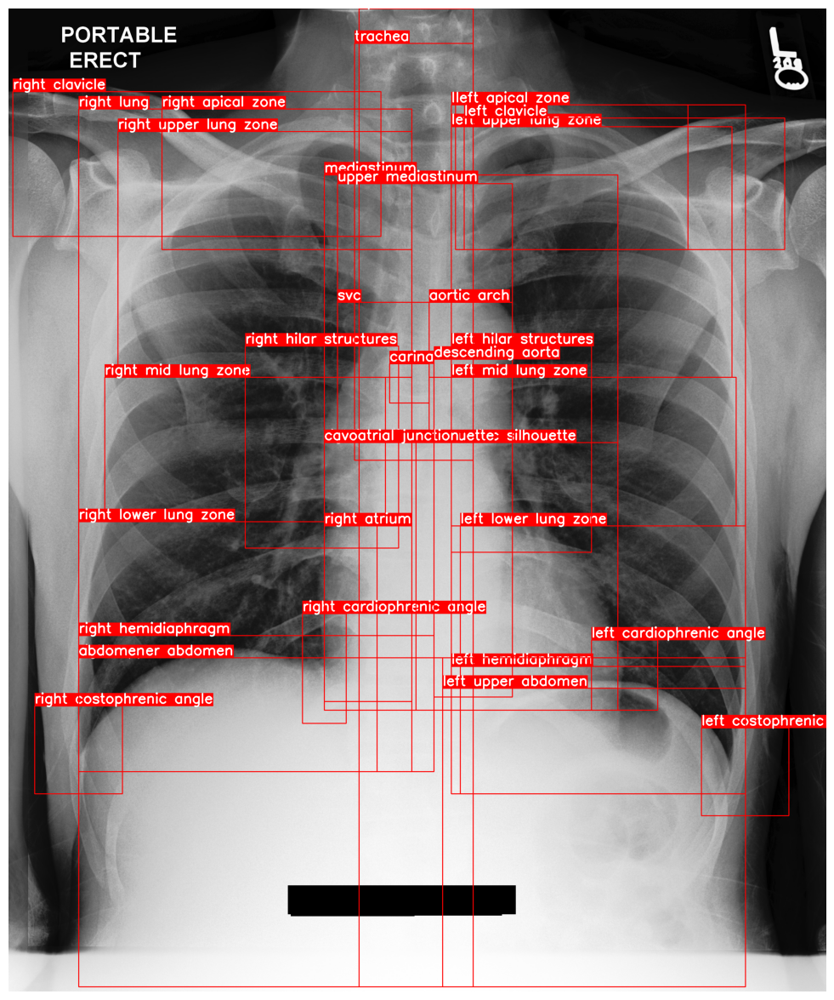

In [24]:
visualize(image, bboxes, category_ids, category_id_to_name, figsize=(15, 15))

In [25]:
# image2 = A.resize(image, 224, 224, )
image2 = cv2.resize(image, (224, 224), interpolation=cv2.INTER_AREA)

In [26]:
image2.shape

(224, 224, 3)

In [27]:
# image = cv2.imread(image_path)
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

transform = A.Compose(
    [
        
#         A.RandomResizedCrop(height, width, scale=(0.1, 0.1), always_apply=True),
#         A.ShiftScaleRotate(p=1, shift_limit=0.1, rotate_limit=20, border_mode=cv2.BORDER_CONSTANT),
        A.ShiftScaleRotate(p=1, shift_limit=0, rotate_limit=0, scale_limit=(-0.5, -0.2), border_mode=cv2.BORDER_CONSTANT),
#         A.ColorJitter(brightness=(1.1,1.9), always_apply=True),
#         A.GaussNoise(always_apply=True, var_limit=(300, 400)),
#         A.RandomBrightnessContrast(always_apply=True)
    ],
    bbox_params=A.BboxParams(format='albumentations'),
    additional_targets={'bboxes2': 'bboxes'}
)

In [33]:
transformed = transform(image=image, bboxes=[], bboxes2=[])

In [87]:
transformed = transform(image=image, bboxes=bboxes, bboxes2=bboxes_2)
print(len(transformed['bboxes']))
print(len(transformed['bboxes2']))
visualize(
    transformed['image'],
#     transformed['bboxes'],
    transformed['bboxes2'],
#     transformed['category_ids'],
    [x[-1] for x in transformed['bboxes2']],
    category_id_to_name,
)

TypeError: object of type 'NoneType' has no len()

In [70]:
transformed['bboxes2']

[[0.22156708935896555,
  0.327116052309672,
  0.3574423392613729,
  0.551810642083486],
 [0.23231132328510284,
  0.42408376932144165,
  0.3466981053352356,
  0.4731675386428833],
 [0.35193921128908795,
  0.41208551327387494,
  0.4145702322324117,
  0.48058464129765827],
 [0.06761006514231363,
  0.7395287950833639,
  0.10338050623734793,
  0.7693062822024027],
 [0.23047695060571036,
  0.6842277447382609,
  0.37526206175486243,
  0.7303664882977804],
 [0.6557914018630981,
  0.20527923107147217,
  0.7703092098236084,
  0.2901396155357361],
 [0.668501059214274,
  0.617364744345347,
  0.7847222288449606,
  0.7082242568333944],
 [0.6415094137191772,
  0.14725130796432495,
  0.7362421154975891,
  0.1963350772857666],
 [0.6611635287602743,
  0.7126963337262472,
  0.7810534636179606,
  0.7558900515238444],
 [0.47536687056223553,
  0.33180628220240277,
  0.5218815406163534,
  0.6636125644048054],
 [0.6878930727640787,
  0.15619546175003052,
  0.8183962305386862,
  0.20080715417861938],
 [0.50576

In [2]:
from importlib import reload
import medvqa

In [4]:
reload(medvqa.datasets.augmentation)

<module 'medvqa.datasets.augmentation' from '/home/pamessina/medvqa/medvqa/datasets/augmentation.py'>

In [3]:
from medvqa.datasets.augmentation import ImageBboxAugmentationTransforms

In [4]:
tmp = ImageBboxAugmentationTransforms((3056, 2544))

In [5]:
tfs = tmp.get_merged_spatial_color_transforms_list()

In [6]:
tfs_color = tmp.get_color_transforms_list()

In [7]:
tfs_spatial = tmp.get_spatial_transforms_list()

In [8]:
len(tfs_color)

2

In [9]:
len(tfs_spatial)

5

In [60]:
aug = tfs_color[1](image=image, bboxes=bboxes, category_ids=category_ids)
# aug = tfs_color[0](image=image, bboxes=bboxes, category_ids=category_ids)
# aug = tfs_spatial[1](image=image, bboxes=bboxes, category_ids=category_ids)

36
(3056, 2544, 3)
(3056, 2544, 3)
(3056, 2544, 3)


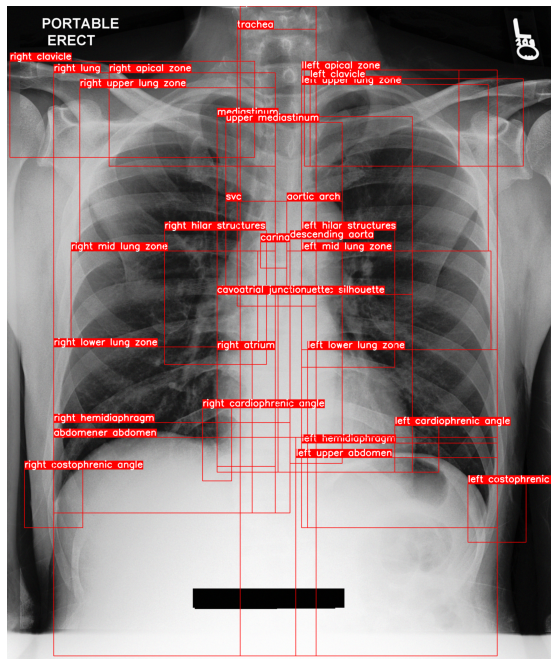

In [61]:
print(len(aug['bboxes']))
print(aug['image'].shape)
visualize(
    aug['image'],
    aug['bboxes'],
    aug['category_ids'],
    category_id_to_name,
    thickness=2,
    text_thickness=3,
)

In [36]:
from medvqa.evaluation.plots import visualize_image_and_polygons
from medvqa.datasets.chexlocalize import extract_images_segmentation_masks_and_binary_labels
import cv2

In [37]:
# Assuming mask is your 2D numpy array of type np.uint8
mask = np.array([[0, 1], [1, 0]], dtype=np.uint8)  # Example mask

# New dimensions
H, W = 100, 100

# Resize the mask
resized_mask = cv2.resize(mask, (W, H), interpolation=cv2.INTER_NEAREST)

In [38]:
resized_mask

array([[0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]], dtype=uint8)

In [328]:
image_paths, masks, labels, polygons, polygon_names = extract_images_segmentation_masks_and_binary_labels(26, 26, return_polygons=True)

Without masks: 216/902


In [14]:
import numpy as np

In [32]:
idxs = np.where(1-labels.flatten())[0]

In [33]:
idxs.shape

(6843,)

In [27]:
masks_ = masks.reshape(-1, 169)

In [28]:
masks_.shape

(9020, 169)

In [35]:
masks_[idxs].sum(-1).max()

0.0

In [13]:
labels[i]

array([1., 1., 0., 1., 0., 0., 0., 0., 0., 0.])

/mnt/workspace/CheXlocalize/CheXpert_512x512/val/patient64541/study1/view1_frontal.jpg


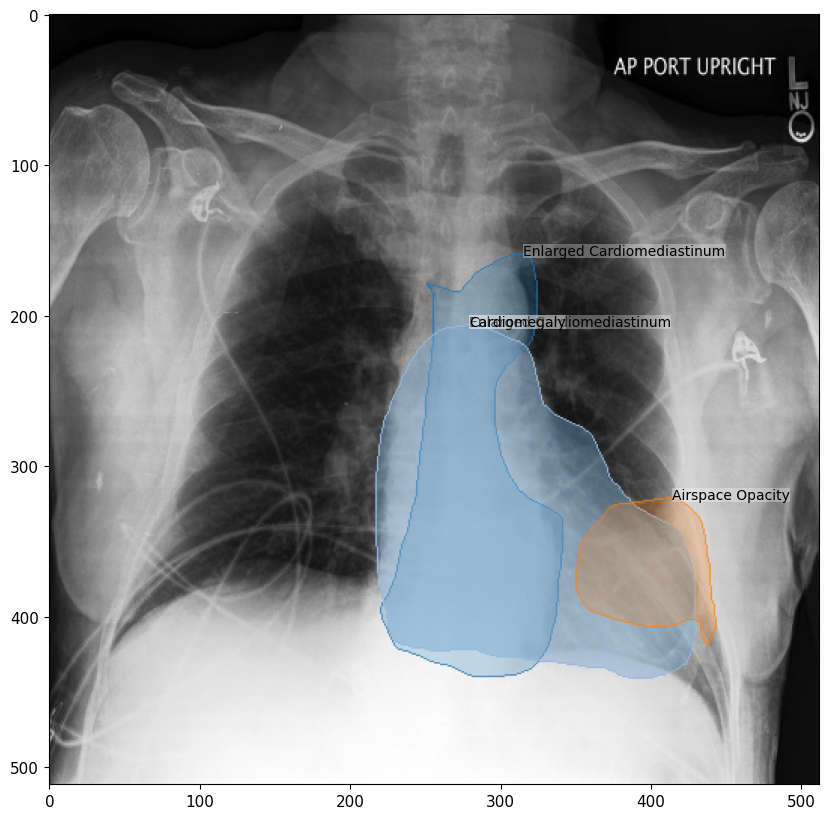

In [236]:
i = 0
print(image_paths[i])
visualize_image_and_polygons(
    image_path=image_paths[i],
    polygons_list=polygons[i],
    polygon_names=polygon_names[i],
    figsize=(10, 10),
    as_segmentation=True,
#     mask_resolution=(100, 100),
)

In [84]:
import albumentations as A
import cv2

transform = A.Compose([
    A.RandomCrop(width=256, height=256),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(
        shift_limit=0,
        scale_limit=0,
        rotate_limit=15,
        border_mode=cv2.BORDER_CONSTANT,
        always_apply=True,
    ),
    A.RandomBrightnessContrast(p=0.2),
])

In [330]:
i = 0
image = cv2.imread(image_paths[i])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [331]:
masks_ = masks[i, np.where(labels[i])[0]]
masks_.shape

(3, 26, 26)

In [332]:
masks_list = [cv2.resize(mask, image.shape[:-1], interpolation=cv2.INTER_NEAREST) for mask in masks_]

In [333]:
masks_list[0].shape

(512, 512)

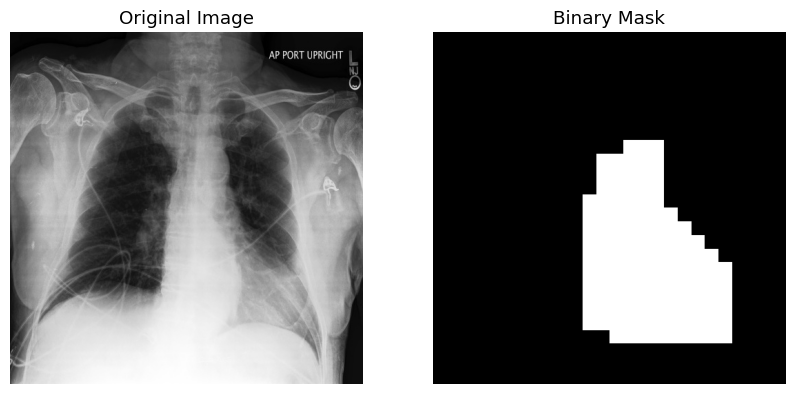

In [334]:
import matplotlib.pyplot as plt

# Plot the image and the mask
plt.figure(figsize=(10, 5))

# Plot the image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Plot the binary mask
plt.subplot(1, 2, 2)
plt.imshow(masks_list[0], cmap='gray')
plt.title('Binary Mask')
plt.axis('off')

plt.show()

In [335]:
def plot_image_with_mask(image, mask, title, alpha=0.5, figsize=(6, 6)):
    # Plot the image
    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

    # Overlay the binary mask
    plt.imshow(mask, cmap='jet', alpha=alpha)
    
    plt.show()

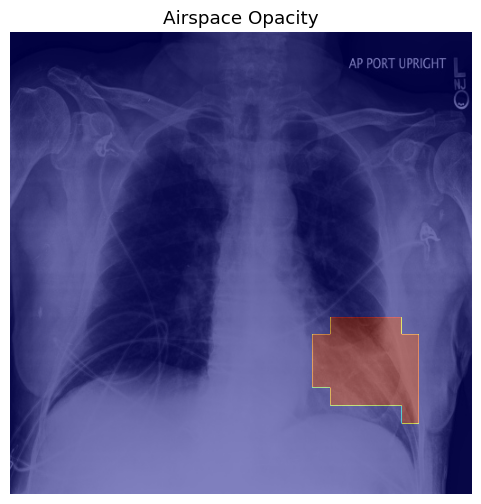

In [336]:
k = 2
plot_image_with_mask(image, masks_list[k], polygon_names[i][k])

In [109]:
transformed = transform(image=image, masks=masks_list)
transformed_image = transformed['image']
transformed_masks = transformed['masks']

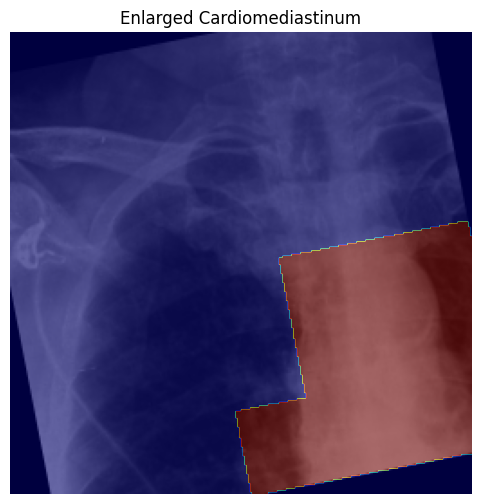

In [112]:
plot_image_with_mask(transformed_image, transformed_masks[k], polygon_names[i][k])

In [113]:
transformed_mask_ = cv2.resize(transformed_masks[k], (13, 13), interpolation=cv2.INTER_NEAREST)
transformed_mask_ = cv2.resize(transformed_mask_, transformed_image.shape[:-1], interpolation=cv2.INTER_NEAREST)

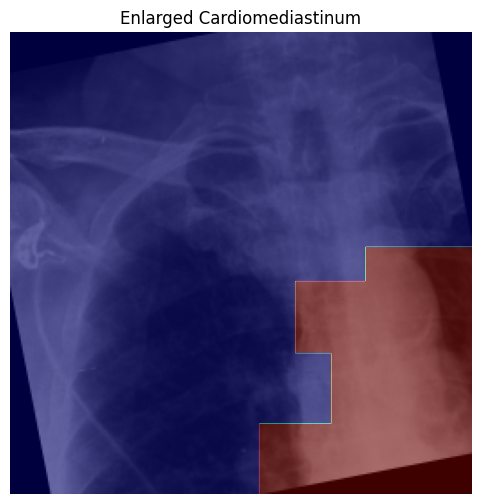

In [114]:
plot_image_with_mask(transformed_image, transformed_mask_, polygon_names[i][k])

In [171]:
from importlib import reload
import medvqa

In [408]:
reload(medvqa.datasets.image_processing)

<module 'medvqa.datasets.image_processing' from '/home/pamessina/medvqa/medvqa/datasets/image_processing.py'>

In [409]:
from medvqa.datasets.image_processing import get_image_transform

In [371]:
custom_transform = get_image_transform(
    image_size=(416,416),
    mask_height=26,
    mask_width=26,
    augmentation_mode='random-color-and-spatial',
    default_prob=0.1,
    use_segmentation_mask_aware_transform=True,
)

get_image_transform()
  Using segmentation mask aware transforms
    len(_augmented_mask_transforms) = 10
    augmentation_mode = random-color-and-spatial
    default_prob = 0.1
    Returning augmented transforms with mode random-color-and-spatial


In [354]:
i = 2
image_, masks_, labels_ = custom_transform(image_paths[i], masks[i].reshape(10,-1), labels[i])
denorm_image_ = denormalize(image_)

_transform()


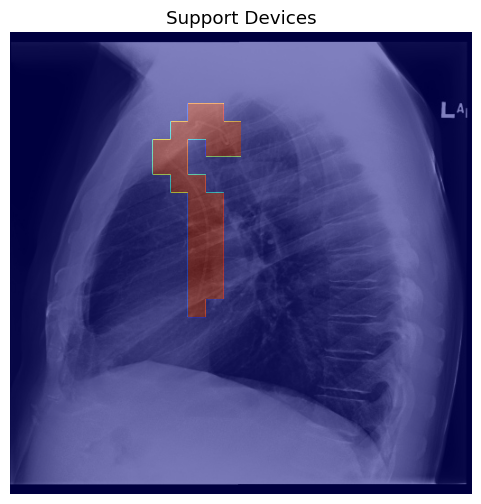

In [353]:
i = 2
k = 0
image = cv2.imread(image_paths[i])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_masks = masks[i, np.where(labels[i])[0]]
masks_list = [cv2.resize(mask, image.shape[:-1], interpolation=cv2.INTER_NEAREST) for mask in image_masks]
plot_image_with_mask(image, masks_list[k], polygon_names[i][k])

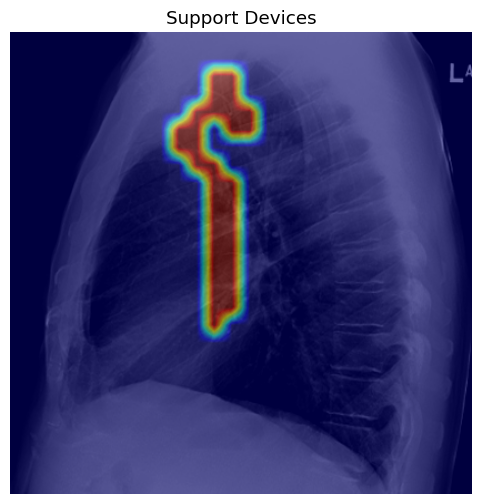

In [355]:
k = 0
pos_idxs = np.where(labels[i])[0]
idx = pos_idxs[k]
plot_image_with_mask(denorm_image_.permute(1, 2, 0).numpy(), cv2.resize(masks_[idx].reshape(26,26), (416, 416)), polygon_names[i][k])

In [180]:
image_.shape

torch.Size([3, 416, 416])

In [124]:
class DeNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be denormalized.
        Returns:
            Tensor: Denormalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
        return tensor

In [125]:
denormalize = DeNormalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))

In [181]:
denorm_image_ = denormalize(image_)

In [182]:
denorm_image_

tensor([[[0.0275, 0.0275, 0.0275,  ..., 0.0431, 0.0431, 0.0431],
         [0.0275, 0.0275, 0.0275,  ..., 0.0431, 0.0431, 0.0431],
         [0.0275, 0.0275, 0.0275,  ..., 0.0431, 0.0431, 0.0431],
         ...,
         [0.2588, 0.3333, 0.4078,  ..., 0.0549, 0.0549, 0.0549],
         [0.2706, 0.3490, 0.4353,  ..., 0.0549, 0.0549, 0.0549],
         [0.2941, 0.3529, 0.4627,  ..., 0.0549, 0.0549, 0.0549]],

        [[0.0275, 0.0275, 0.0275,  ..., 0.0431, 0.0431, 0.0431],
         [0.0275, 0.0275, 0.0275,  ..., 0.0431, 0.0431, 0.0431],
         [0.0275, 0.0275, 0.0275,  ..., 0.0431, 0.0431, 0.0431],
         ...,
         [0.2588, 0.3333, 0.4078,  ..., 0.0549, 0.0549, 0.0549],
         [0.2706, 0.3490, 0.4353,  ..., 0.0549, 0.0549, 0.0549],
         [0.2941, 0.3529, 0.4627,  ..., 0.0549, 0.0549, 0.0549]],

        [[0.0275, 0.0275, 0.0275,  ..., 0.0431, 0.0431, 0.0431],
         [0.0275, 0.0275, 0.0275,  ..., 0.0431, 0.0431, 0.0431],
         [0.0275, 0.0275, 0.0275,  ..., 0.0431, 0.0431, 0.

In [158]:
%matplotlib inline

In [185]:
masks_[idx].shape

(169,)

In [410]:
custom_transform = get_image_transform(
    image_size=(416,416),
    mask_height=13,
    mask_width=13,
    augmentation_mode='random-color-and-spatial',
    default_prob=0.5,
    use_segmentation_mask_aware_transform=True,
)

get_image_transform()
  Using segmentation mask aware transforms
    len(_augmented_mask_transforms) = 10
    augmentation_mode = random-color-and-spatial
    default_prob = 0.5
    Returning augmented transforms with mode random-color-and-spatial


In [356]:
from medvqa.datasets.mimiccxr import get_mimiccxr_medium_image_path, get_imageId2PartPatientStudy
from medvqa.datasets.ms_cxr import get_ms_cxr_dicom_id_2_phrases_and_masks

In [357]:
dicom_id_2_phrases_and_masks = get_ms_cxr_dicom_id_2_phrases_and_masks(13, 13)

In [360]:
dicom_ids = list(dicom_id_2_phrases_and_masks.keys())

In [362]:
dicom_id_2_phrases_and_masks[dicom_ids[0]][1][0].shape

(169,)

In [364]:
imageId2PartPatientStudy = get_imageId2PartPatientStudy()

In [478]:
i = -1
did = dicom_ids[i]
phrases, masks = dicom_id_2_phrases_and_masks[did]
masks = np.array(masks)
image_path = get_mimiccxr_medium_image_path(*imageId2PartPatientStudy[did], did)
image_path, phrases

('/mnt/workspace/mimic-cxr-jpg/images-medium(512)/p13/p13859188/s52811469/0677ec27-61328435-0dfee3b9-356bfc03-8cbd3353.jpg',
 ['Small bilateral pleural effusions are presumed'])

In [395]:
def aux(x, *args):
    if args:
        return x, *args
    return x

In [397]:
aux(4)

4

In [490]:
image_, masks_ = custom_transform(image_path, masks.reshape(-1,  169))
denorm_image_ = denormalize(image_)

_transform()


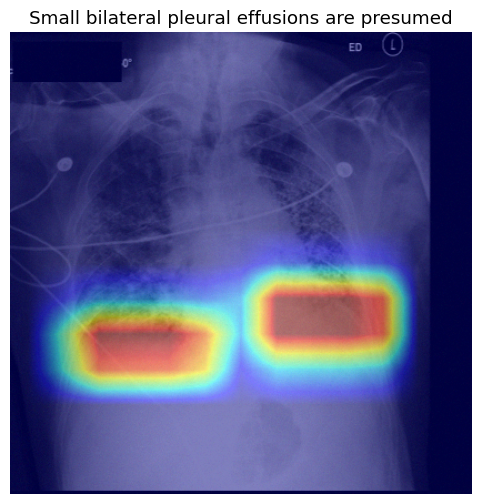

In [491]:
k = 0
plot_image_with_mask(denorm_image_.permute(1, 2, 0).numpy(), cv2.resize(masks_[k].reshape(13,13), (416, 416)), phrases[k])

In [508]:
from medvqa.datasets.vinbig import (
    compute_masks_and_binary_labels_from_bounding_boxes,
    load_train_image_id_2_bboxes,
    get_medium_size_image_path,
    VINBIG_BBOX_NAMES
)

In [495]:
vinbig_image_id_2_bboxes = load_train_image_id_2_bboxes(True, True)

Anomalous bboxes found: 29 of 37367
class_id_offset: 0


In [496]:
image_ids = list(vinbig_image_id_2_bboxes.keys())

In [547]:
custom_transform = get_image_transform(
    image_size=(416,416),
    mask_height=13,
    mask_width=13,
    augmentation_mode='random-color-and-spatial',
    default_prob=0.5,
    use_segmentation_mask_aware_transform=True,
)

get_image_transform()
  Using segmentation mask aware transforms
    len(_augmented_mask_transforms) = 10
    augmentation_mode = random-color-and-spatial
    default_prob = 0.5
    Returning augmented transforms with mode random-color-and-spatial


In [548]:
i = 1
image_path = get_medium_size_image_path(image_ids[i])
bboxes = vinbig_image_id_2_bboxes[image_ids[i]]
masks_, labels_ = compute_masks_and_binary_labels_from_bounding_boxes(
    mask_height=13, mask_width=13, bbox_coords=bboxes[0], bbox_classes=bboxes[1],
)
image_path

'/mnt/workspace/vinbig-cxr/dataset-jpg/images-512x512(keep_aspect_ratio)/0007d316f756b3fa0baea2ff514ce945.jpg'

In [562]:
transf_image_, transf_masks_ = custom_transform(image_path, masks_.reshape(-1,  169))
denorm_image_ = denormalize(transf_image_)

_transform()


In [550]:
labels_, np.where(labels_)

(array([          1,           0,           0,           1,           0,           0,           0,           0,           0,           1,           0,           0,           0,           0,           0,           0,           0,           0,           1,           0,           1,           0], dtype=float32),
 (array([ 0,  3,  9, 18, 20]),))

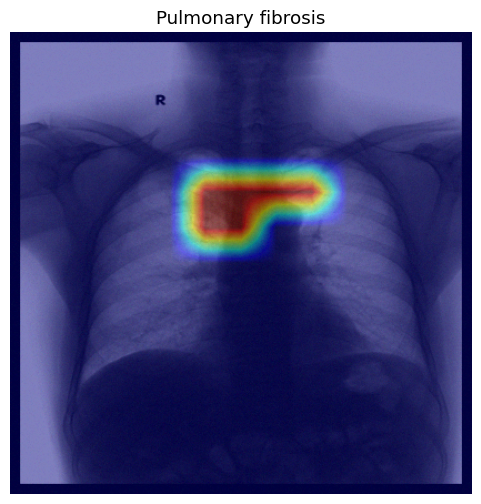

In [563]:
k = 20
plot_image_with_mask(denorm_image_.permute(1, 2, 0).numpy(), cv2.resize(transf_masks_[k].reshape(13,13), (416, 416)), VINBIG_BBOX_NAMES[k])

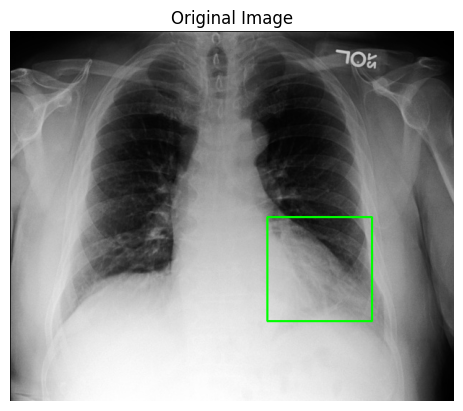

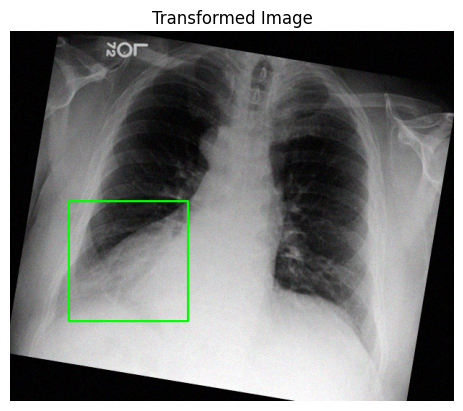

In [38]:
import cv2
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt
from albumentations.pytorch import ToTensorV2

class CoarseDropoutWithoutBbox(A.CoarseDropout):
    def apply_to_bbox(self, bbox, **params):
        # Skip any transformation to bounding boxes
        return bbox

def visualize(image, bboxes, title="Image"):
    """Helper function to visualize an image with bounding boxes."""
    image = image.copy()
    for (x_min, y_min, x_max, y_max) in bboxes:
        cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()

def main(image_path, bboxes):
    """Loads an image, visualizes it with bounding boxes, applies transformations, and visualizes again."""
    # Load image
    image = cv2.imread(image_path)
    height, width = image.shape[:2]
    
    # Convert bounding boxes to Albumentations format (x_min, y_min, x_max, y_max)
    bbox_labels = ['object'] * len(bboxes)  # Dummy class labels
    
    adapted_bboxes = [(bbox[0]/width, bbox[1]/height, bbox[2]/width, bbox[3]/height, label) for bbox, label in zip(bboxes, bbox_labels)]
    
    # Define Albumentations transformation pipeline
    transform = A.Compose([
        A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=0.5),
        A.RandomResizedCrop(
            width=width,
            height=height,
            scale=(0.8, 1),
            interpolation=cv2.INTER_CUBIC,
            p=1.0,
        ),
        A.Resize(width=width, height=height, always_apply=True, interpolation=cv2.INTER_CUBIC),
        A.ShiftScaleRotate(
            shift_limit=0.1,
            scale_limit=0.1,
            rotate_limit=20,
            border_mode=cv2.BORDER_CONSTANT,
            p=0.5,
        ),
        A.HorizontalFlip(p=0.5),
        CoarseDropoutWithoutBbox(
            max_holes=8,
            max_height=int(height * 0.05),
            max_width=int(width * 0.05),
            min_holes=4,
            min_height=int(height * 0.01),
            min_width=int(width * 0.01),
            fill_value=0,
            p=0.5,
        ),
        A.ColorJitter(
            brightness=0.2,
            contrast=0.2,
            saturation=0.2,
            hue=0.2,
            p=0.5,
        ),
        A.GaussNoise(
            var_limit=(10, 50),
            p=0.2,
        ),
        A.GaussianBlur(
            blur_limit=(3, 5),
            p=0.2,
        )
#     ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))
    ], bbox_params=A.BboxParams(format='albumentations'))
    
    # Visualize original image and bounding boxes
    visualize(image, bboxes, title="Original Image")
    
    # Apply transformations
    transformed = transform(image=image, bboxes=adapted_bboxes)
    transformed_image = transformed['image']
    transformed_bboxes = transformed['bboxes']
    
    transformed_bboxes = [(bbox[0] * width, bbox[1] * height, bbox[2] * width, bbox[3] * height) for bbox in transformed_bboxes]
    
    # Visualize transformed image and bounding boxes
    visualize(transformed_image, transformed_bboxes, title="Transformed Image")

# Example usage
image_path = "/mnt/workspace/physionet.org/files/mimic-cxr-jpg/2.0.0/files/p10/p10483304/s50076705/4a050186-c6320c70-b83046e2-f2c1f2b6-85c0f190.jpg"  # Replace with your image path
bounding_boxes = [(356.40215968586386, 257.0062893081761, 356.40215968586386 + 144.6940445026178, 257.0062893081761 + 144.9056603773585)]
# bounding_boxes = [(50, 50, 200, 200), (100, 100, 250, 300)]  # Example bounding boxes
main(image_path, bounding_boxes)

--- Running Function 1 (No Augmentation) ---


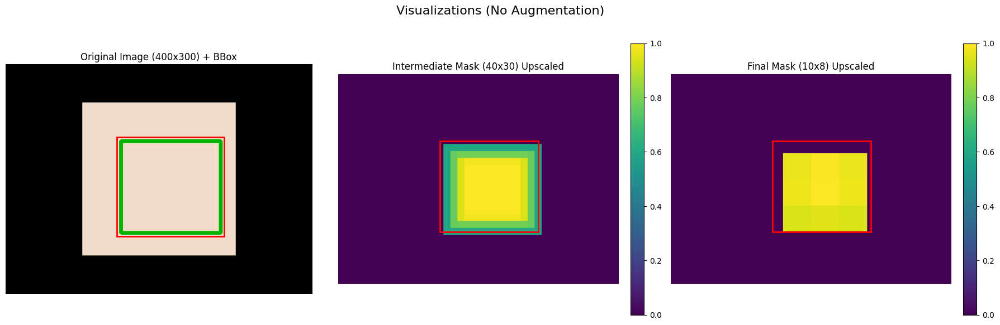


--- Running Function 2 (With Augmentation) ---
Augmentation Run 1


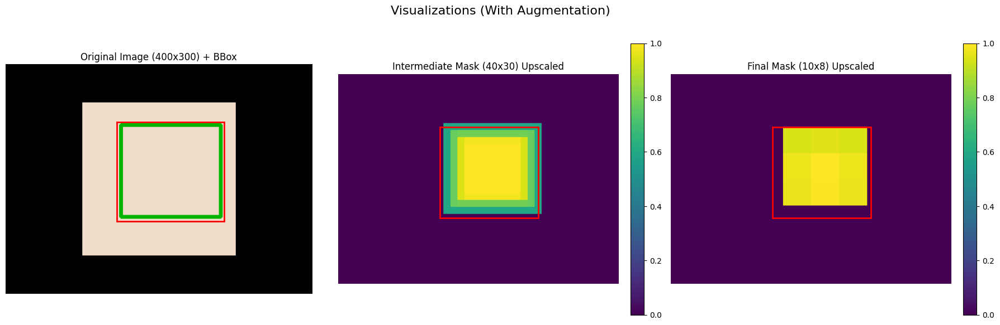

Augmentation Run 2


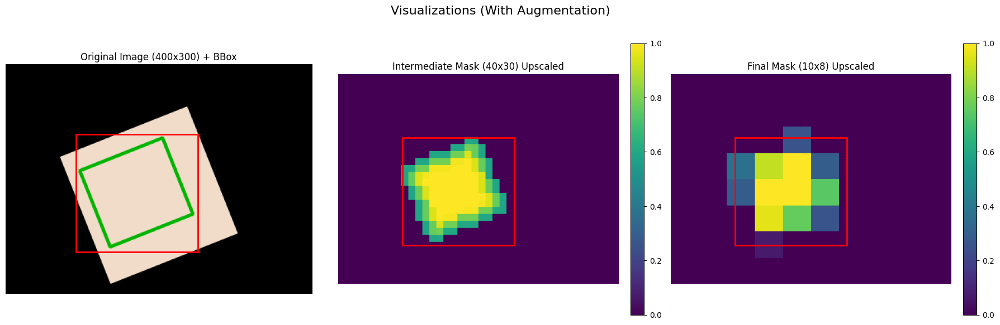

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import albumentations as A
from PIL import Image # Needed for loading image if not using cv2 directly everywhere

# Helper function to visualize
def visualize(image_rgb, bbox, prob_mask_m, prob_mask_f, title_suffix=""):
    """Visualizes the image, bbox, intermediate mask, and final mask."""
    H, W, _ = image_rgb.shape
    Hm, Wm = prob_mask_m.shape
    Hf, Wf = prob_mask_f.shape

    # Upscale masks for visualization to match image dimensions
    # Use NEAREST interpolation to see the 'pixelated' effect clearly
    vis_mask_m = cv2.resize(prob_mask_m, (W, H), interpolation=cv2.INTER_NEAREST)
    vis_mask_f = cv2.resize(prob_mask_f, (W, H), interpolation=cv2.INTER_NEAREST)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle(f"Visualizations {title_suffix}", fontsize=16)

    # 1. Image + BBox
    axes[0].imshow(image_rgb)
    rect = patches.Rectangle(
        (bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1],
        linewidth=2, edgecolor='r', facecolor='none'
    )
    axes[0].add_patch(rect)
    axes[0].set_title(f"Original Image ({W}x{H}) + BBox")
    axes[0].axis('off')

    # 2. Intermediate Probabilistic Mask (Wm x Hm)
    im_m = axes[1].imshow(vis_mask_m, cmap='viridis', vmin=0, vmax=1)
    rect_m = patches.Rectangle(
        (bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1],
        linewidth=2, edgecolor='r', facecolor='none'
    )
    axes[1].add_patch(rect_m)
    axes[1].set_title(f"Intermediate Mask ({Wm}x{Hm}) Upscaled")
    axes[1].axis('off')
    fig.colorbar(im_m, ax=axes[1], fraction=0.046, pad=0.04)


    # 3. Final Probabilistic Mask (Wf x Hf)
    im_f = axes[2].imshow(vis_mask_f, cmap='viridis', vmin=0, vmax=1)
    rect_f = patches.Rectangle(
        (bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1],
        linewidth=2, edgecolor='r', facecolor='none'
    )
    axes[2].add_patch(rect_f)
    axes[2].set_title(f"Final Mask ({Wf}x{Hf}) Upscaled")
    axes[2].axis('off')
    fig.colorbar(im_f, ax=axes[2], fraction=0.046, pad=0.04)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()

# --- Function 1: Basic Mask Generation ---
def create_and_visualize_mask(image_path, bbox, intermediate_res, final_res):
    """
    Creates coarse probabilistic masks from a bounding box and visualizes them.

    Args:
        image_path (str): Path to the input image.
        bbox (list/tuple): Bounding box coordinates [x_min, y_min, x_max, y_max].
        intermediate_res (tuple): Intermediate resolution (Wm, Hm).
        final_res (tuple): Final resolution (Wf, Hf).
    """
    # Read image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    H, W, _ = img_rgb.shape
    Wm, Hm = intermediate_res
    Wf, Hf = final_res

    # --- Create Intermediate Probabilistic Mask (Wm x Hm) ---
    prob_mask_m = np.zeros((Hm, Wm), dtype=np.float32)

    # Map bbox coordinates to intermediate grid
    scale_w = Wm / W
    scale_h = Hm / H
    x_min_m, y_min_m = bbox[0] * scale_w, bbox[1] * scale_h
    x_max_m, y_max_m = bbox[2] * scale_w, bbox[3] * scale_h

    # Bbox center and dimensions in intermediate grid
    center_x_m = (x_min_m + x_max_m) / 2
    center_y_m = (y_min_m + y_max_m) / 2
    bbox_w_m = x_max_m - x_min_m
    bbox_h_m = y_max_m - y_min_m

    # Define inner rectangle (60%) dimensions
    inner_scale = 0.60
    inner_w_m = bbox_w_m * inner_scale
    inner_h_m = bbox_h_m * inner_scale
    inner_x_min_m = center_x_m - inner_w_m / 2
    inner_y_min_m = center_y_m - inner_h_m / 2
    inner_x_max_m = center_x_m + inner_w_m / 2
    inner_y_max_m = center_y_m + inner_h_m / 2

    # Create coordinate grid for vectorized calculation
    yy, xx = np.meshgrid(np.arange(Hm), np.arange(Wm), indexing='ij')

    # Calculate normalized distance from center (max of x/y normalized distances)
    # Add epsilon to avoid division by zero for zero-sized boxes
    dist_x_norm = np.abs(xx - center_x_m) / (bbox_w_m / 2 + 1e-6)
    dist_y_norm = np.abs(yy - center_y_m) / (bbox_h_m / 2 + 1e-6)
    norm_dist = np.maximum(dist_x_norm, dist_y_norm)

    # Define masks for different regions based on normalized distance
    # Clamp coordinates to be within grid boundaries for mask creation
    x_min_m_idx, y_min_m_idx = int(np.floor(x_min_m)), int(np.floor(y_min_m))
    x_max_m_idx, y_max_m_idx = int(np.ceil(x_max_m)), int(np.ceil(y_max_m))
    x_max_m_idx = min(x_max_m_idx, Wm) # Ensure indices are within bounds
    y_max_m_idx = min(y_max_m_idx, Hm)

    # Create a mask for the area within the bounding box in the intermediate grid
    bbox_region_mask = (xx >= x_min_m_idx) & (xx < x_max_m_idx) & \
                       (yy >= y_min_m_idx) & (yy < y_max_m_idx)

    # Inner region (probability 1.0)
    inner_mask = (norm_dist <= inner_scale) & bbox_region_mask

    # Interpolation region (between inner and outer box boundary)
    interp_mask = (norm_dist > inner_scale) & (norm_dist <= 1.0) & bbox_region_mask

    # Assign probabilities
    prob_mask_m[inner_mask] = 1.0

    # Interpolate linearly from 1.0 (at norm_dist=inner_scale) to 0.5 (at norm_dist=1.0)
    interp_values = 1.0 - (norm_dist[interp_mask] - inner_scale) / (1.0 - inner_scale) * 0.5
    prob_mask_m[interp_mask] = np.clip(interp_values, 0.5, 1.0)

    # Ensure boundary cells (where norm_dist is very close to 1.0) are exactly 0.5
    boundary_mask = (np.isclose(norm_dist, 1.0)) & bbox_region_mask
    prob_mask_m[boundary_mask] = 0.5

    # --- Create Final Probabilistic Mask (Wf x Hf) ---
    # Resize the intermediate mask to the final resolution
    # Use INTER_LINEAR for a smoother downsampling of probabilities
    prob_mask_f = cv2.resize(prob_mask_m, (Wf, Hf), interpolation=cv2.INTER_LINEAR)

    # --- Visualize ---
    visualize(img_rgb, bbox, prob_mask_m, prob_mask_f, title_suffix="(No Augmentation)")


# --- Function 2: Mask Generation with Albumentations ---
def create_visualize_augmented_mask(image_path, bbox, intermediate_res, final_res):
    """
    Creates coarse probabilistic masks, applies spatial augmentation, and visualizes.

    Args:
        image_path (str): Path to the input image.
        bbox (list/tuple): Bounding box coordinates [x_min, y_min, x_max, y_max].
        intermediate_res (tuple): Intermediate resolution (Wm, Hm).
        final_res (tuple): Final resolution (Wf, Hf).
    """
    # Read image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return
    # Keep in BGR for Albumentations, convert later for Matplotlib
    H, W, _ = img.shape
    Wm, Hm = intermediate_res
    Wf, Hf = final_res

    # --- Create Initial Intermediate Probabilistic Mask (Wm x Hm) ---
    # (Same logic as in function 1)
    prob_mask_m = np.zeros((Hm, Wm), dtype=np.float32)
    scale_w = Wm / W
    scale_h = Hm / H
    x_min_m, y_min_m = bbox[0] * scale_w, bbox[1] * scale_h
    x_max_m, y_max_m = bbox[2] * scale_w, bbox[3] * scale_h
    center_x_m = (x_min_m + x_max_m) / 2
    center_y_m = (y_min_m + y_max_m) / 2
    bbox_w_m = x_max_m - x_min_m
    bbox_h_m = y_max_m - y_min_m
    inner_scale = 0.60
    yy, xx = np.meshgrid(np.arange(Hm), np.arange(Wm), indexing='ij')
    dist_x_norm = np.abs(xx - center_x_m) / (bbox_w_m / 2 + 1e-6)
    dist_y_norm = np.abs(yy - center_y_m) / (bbox_h_m / 2 + 1e-6)
    norm_dist = np.maximum(dist_x_norm, dist_y_norm)

    x_min_m_idx, y_min_m_idx = int(np.floor(x_min_m)), int(np.floor(y_min_m))
    x_max_m_idx, y_max_m_idx = int(np.ceil(x_max_m)), int(np.ceil(y_max_m))
    x_max_m_idx = min(x_max_m_idx, Wm)
    y_max_m_idx = min(y_max_m_idx, Hm)

    bbox_region_mask = (xx >= x_min_m_idx) & (xx < x_max_m_idx) & \
                       (yy >= y_min_m_idx) & (yy < y_max_m_idx)
    inner_mask = (norm_dist <= inner_scale) & bbox_region_mask
    interp_mask = (norm_dist > inner_scale) & (norm_dist <= 1.0) & bbox_region_mask

    prob_mask_m[inner_mask] = 1.0
    interp_values = 1.0 - (norm_dist[interp_mask] - inner_scale) / (1.0 - inner_scale) * 0.5
    prob_mask_m[interp_mask] = np.clip(interp_values, 0.5, 1.0)
    boundary_mask = (np.isclose(norm_dist, 1.0)) & bbox_region_mask
    prob_mask_m[boundary_mask] = 0.5

    # --- Define Albumentations Transform ---
    # Using BBoxSafeRandomCrop ensures the bbox (or part of it) stays in view
    # Using pascal_voc format: [x_min, y_min, x_max, y_max]
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        # Note: RandomSizedBBoxSafeCrop changes image size!
        # If you want to keep original size, use RandomCrop or PadIfNeeded before Crop
        # Or use ShiftScaleRotate which can handle bboxes and masks
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=30, p=0.7,
                           border_mode=cv2.BORDER_CONSTANT, value=0, mask_value=0),
        # Example using RandomSizedBBoxSafeCrop (might change aspect ratio)
        # A.RandomSizedBBoxSafeCrop(width=int(W*0.8), height=int(H*0.8), erosion_rate=0.2, p=1.0),
        # A.Resize(H, W) # Resize back if needed after crop
    ],
    bbox_params=A.BboxParams(format='pascal_voc', label_fields=['category_ids'], min_visibility=0.1),
    additional_targets={'mask': 'mask'} # Crucial: tell Albumentations about the mask
    )

    # --- Apply Transformation ---
    # Albumentations expects list of bboxes and category_ids
    bboxes = [list(bbox)]
    category_ids = [1] # Dummy category id

    try:
        transformed = transform(image=img, # Use BGR image
                                bboxes=bboxes,
                                category_ids=category_ids,
                                mask=prob_mask_m) # Pass the intermediate mask

        transformed_img_bgr = transformed['image']
        transformed_bboxes = transformed['bboxes']
        transformed_mask_m = transformed['mask'] # Transformed intermediate mask

        if not transformed_bboxes:
             print("Warning: Bounding box was lost during augmentation.")
             # Handle this case: maybe skip visualization or show without bbox
             transformed_bbox = [0, 0, 0, 0] # Placeholder
        else:
            transformed_bbox = transformed_bboxes[0] # Get the first (only) bbox

        # Convert transformed image to RGB for visualization
        transformed_img_rgb = cv2.cvtColor(transformed_img_bgr, cv2.COLOR_BGR2RGB)
        Ht, Wt, _ = transformed_img_rgb.shape # Get potentially new dimensions

        # --- Create Final Probabilistic Mask (Wf x Hf) from Transformed Mask ---
        # Resize the *transformed* intermediate mask to the final resolution
        transformed_mask_f = cv2.resize(transformed_mask_m, (Wf, Hf), interpolation=cv2.INTER_LINEAR)

        # --- Visualize Transformed Data ---
        # Use the general visualize function, passing transformed data
        visualize(transformed_img_rgb, transformed_bbox, transformed_mask_m, transformed_mask_f, title_suffix="(With Augmentation)")

    except Exception as e:
        print(f"Error during augmentation or visualization: {e}")
        # This can happen if crop removes the bbox entirely depending on parameters
        print("Original data:")
        visualize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), bbox, prob_mask_m,
                  cv2.resize(prob_mask_m, (Wf, Hf), interpolation=cv2.INTER_LINEAR),
                  title_suffix="(Augmentation Failed - Showing Original)")


# --- Example Usage ---
# Create a dummy image for demonstration if you don't have one
dummy_image_path = "dummy_image.png"
dummy_img = np.zeros((300, 400, 3), dtype=np.uint8)
dummy_img[50:250, 100:300, :] = (200, 220, 240) # Light background
cv2.rectangle(dummy_img, (150, 100), (280, 220), (0, 180, 0), 3) # A green box inside
cv2.imwrite(dummy_image_path, dummy_img)

# Define parameters
image_file = dummy_image_path # Replace with your image path
# Bbox slightly larger than the green box in the dummy image
bounding_box = [145, 95, 285, 225] # [x_min, y_min, x_max, y_max]
intermediate_resolution = (40, 30) # (Wm, Hm) - cols, rows
final_resolution = (10, 8)       # (Wf, Hf) - cols, rows

# Run Function 1
print("--- Running Function 1 (No Augmentation) ---")
create_and_visualize_mask(image_file, bounding_box, intermediate_resolution, final_resolution)

# Run Function 2
print("\n--- Running Function 2 (With Augmentation) ---")
# Run multiple times to see different augmentations
for i in range(2):
    print(f"Augmentation Run {i+1}")
    create_visualize_augmented_mask(image_file, bounding_box, intermediate_resolution, final_resolution)
    plt.pause(0.5) # Pause briefly to see plots if running in interactive mode



--- Running Preprocessing ---
Generated 3 masks.
 Mask 0 (Fracture) shape: (80, 100) (HxW)


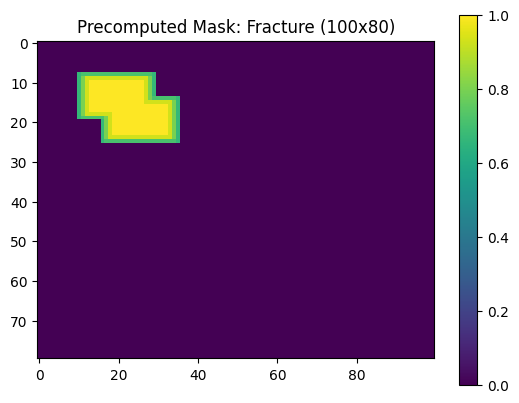

 Mask 1 (Nodule) shape: (80, 100) (HxW)


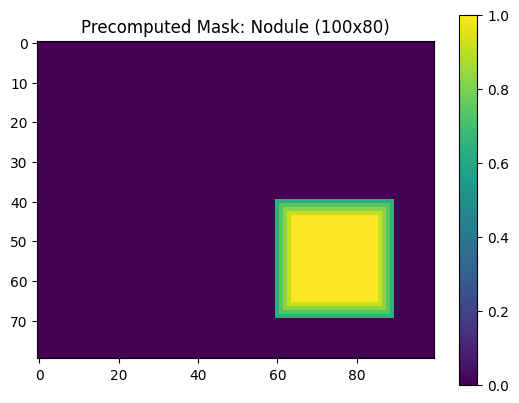

 Mask 2 (Scoliosis) shape: (80, 100) (HxW)


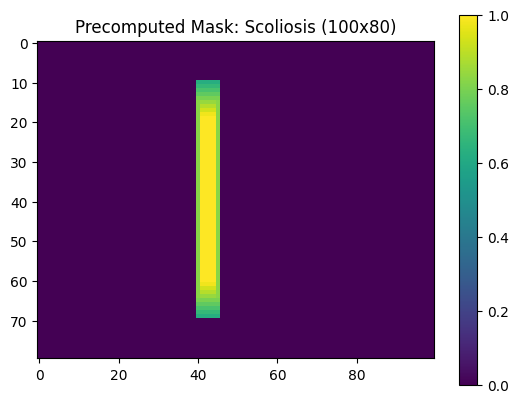


--- Running Visualization (No Augmentation) ---


/tmp/ipykernel_12705/46590161.py:360: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', len(finding_classes))


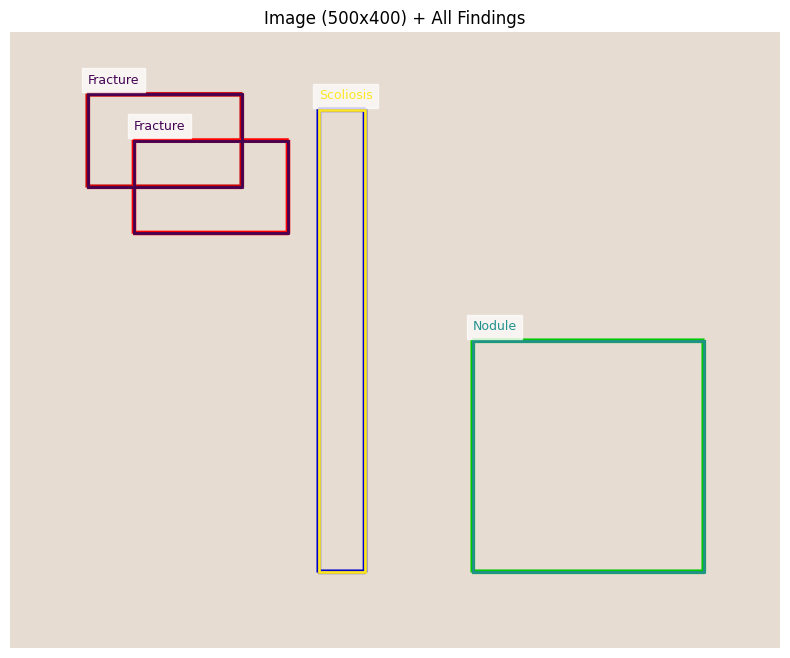

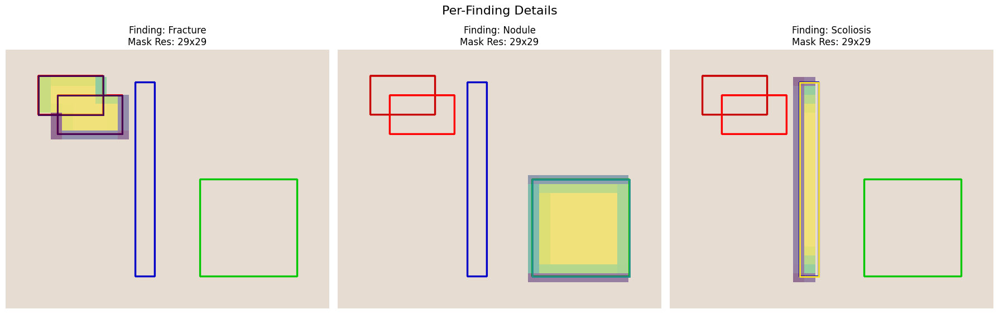

Returned final masks shapes: [(29, 29), (29, 29), (29, 29)]

--- Running Visualization (With Augmentation) ---

--- Augmentation Run 1 ---


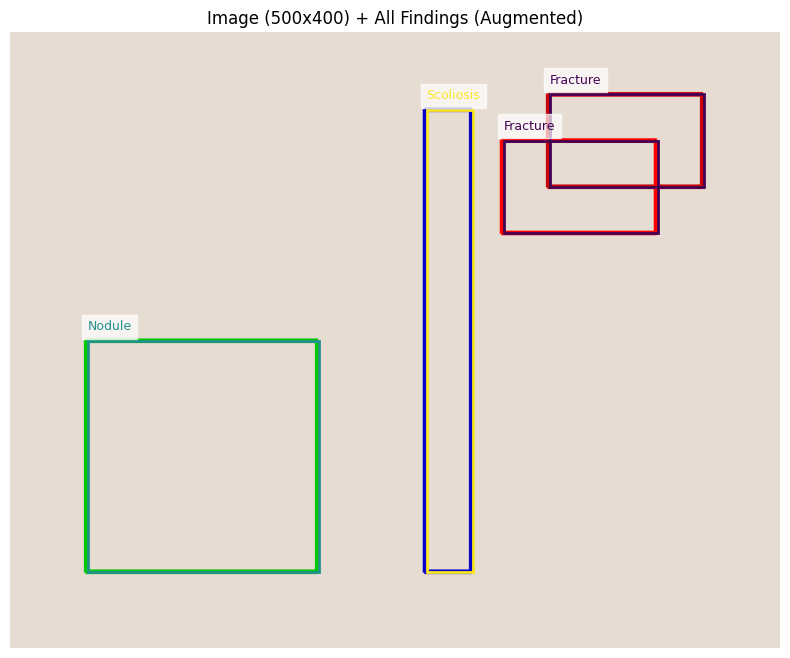

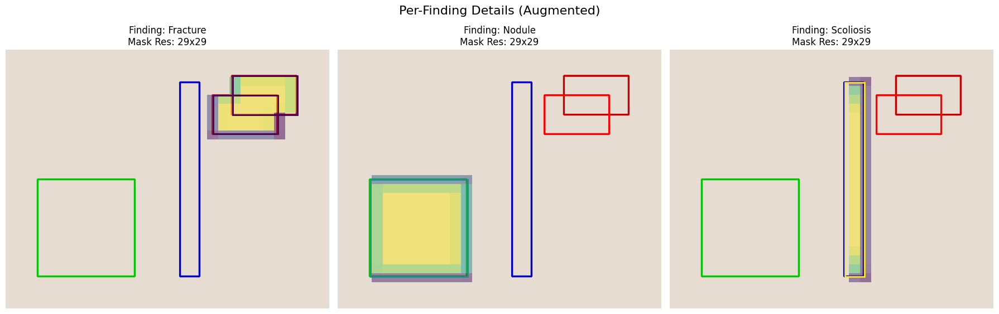

Returned final augmented masks shapes: [(29, 29), (29, 29), (29, 29)]
Returned augmented bboxes per class: [[[350, 40, 450, 100], [320, 70, 420, 130]], [[49, 200, 200, 350]], [[270, 50, 300, 350]]]

--- Augmentation Run 2 ---


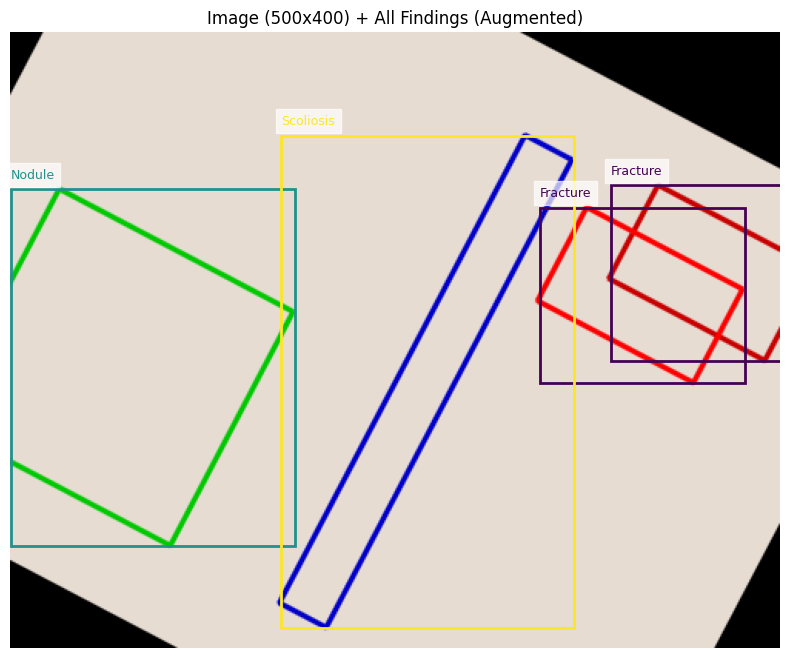

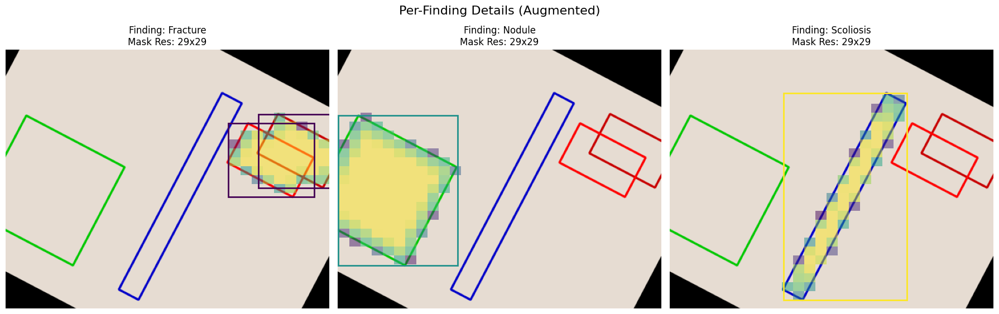

Returned final augmented masks shapes: [(29, 29), (29, 29), (29, 29)]
Returned augmented bboxes per class: [[[389, 99, 500, 213], [343, 113, 476, 227]], [[0, 101, 184, 333]], [[175, 66, 365, 386]]]

--- Augmentation Run 3 ---


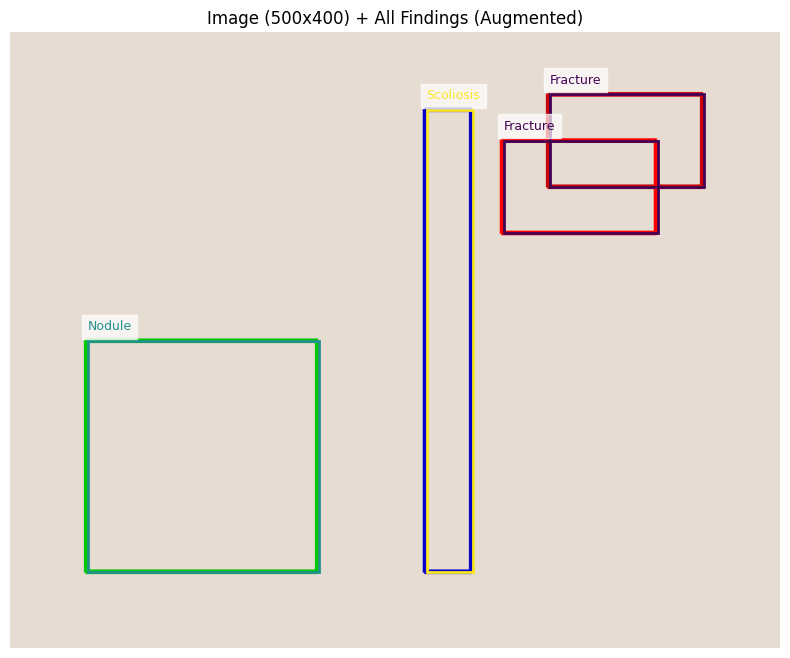

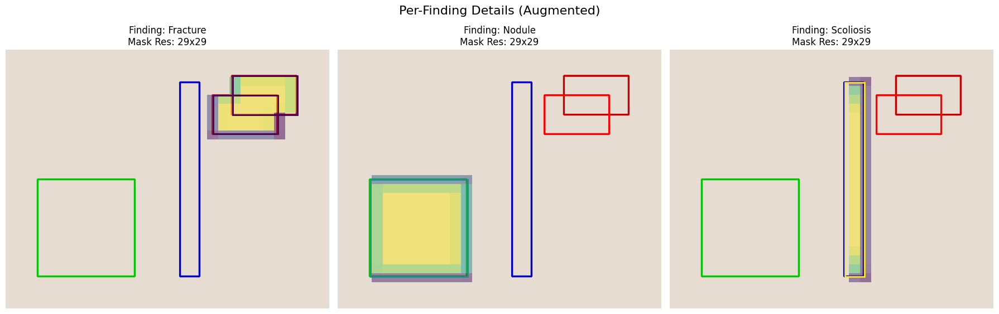

Returned final augmented masks shapes: [(29, 29), (29, 29), (29, 29)]
Returned augmented bboxes per class: [[[350, 40, 450, 100], [320, 70, 420, 130]], [[49, 200, 200, 350]], [[270, 50, 300, 350]]]

--- Augmentation Run 4 ---


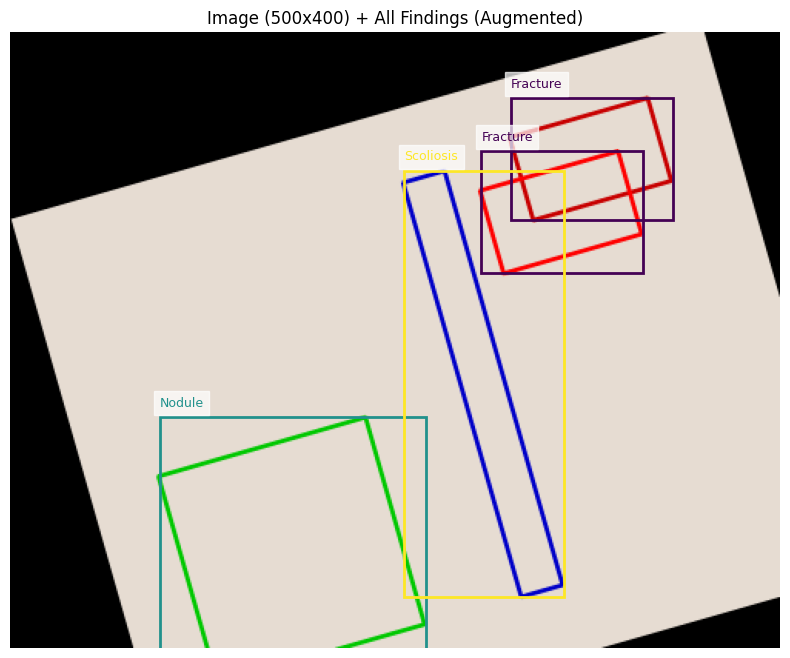

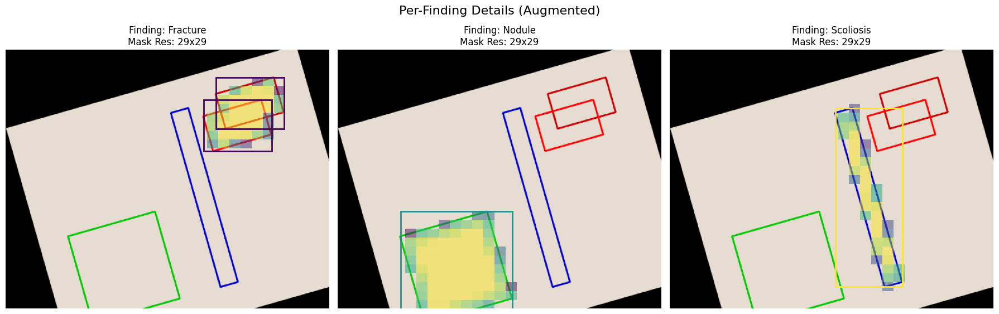

Returned final augmented masks shapes: [(29, 29), (29, 29), (29, 29)]
Returned augmented bboxes per class: [[[324, 42, 429, 121], [305, 76, 410, 156]], [[96, 249, 269, 400]], [[255, 89, 359, 366]]]


In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as mcolors
from typing import List, Tuple, Dict, Optional
import albumentations as A
import os # For path joining

def draw_mask_cells(
    ax: plt.Axes,
    low_res_mask: np.ndarray,
    display_shape: Tuple[int, int],
    cmap_name: str = 'viridis',
    alpha: float = 0.5,
    vmin: float = 0.0,
    vmax: float = 1.0
) -> None:
    """
    Draws a low-resolution mask onto a Matplotlib Axes by drawing
    individual rectangles for each cell.

    Args:
        ax: The Matplotlib Axes object to draw on.
        low_res_mask: The 2D NumPy array representing the low-resolution mask (Hf, Wf).
        display_shape: The target display dimensions (H_final, W_final)
                       corresponding to the image the mask overlays.
        cmap_name: Name of the Matplotlib colormap to use.
        alpha: Transparency level for the rectangles (0.0 to 1.0).
        vmin: The minimum value for the colormap scaling.
        vmax: The maximum value for the colormap scaling.
    """
    H_final, W_final = display_shape
    Hf, Wf = low_res_mask.shape

    if Hf == 0 or Wf == 0:
        return # Nothing to draw for an empty mask

    # Calculate the size of each upscaled cell (rectangle)
    rect_height = H_final / Hf
    rect_width = W_final / Wf

    # Get the colormap and normalization function
    cmap = plt.get_cmap(cmap_name)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    # Iterate through each cell in the low-resolution mask
    for r in range(Hf):
        for c in range(Wf):
            probability = low_res_mask[r, c]

            # Only draw cells with non-zero probability
            if probability > 0:
                # Calculate the top-left corner of the rectangle
                x_min = c * rect_width
                y_min = r * rect_height # Matplotlib's origin is top-left for patches

                # Get the color from the colormap based on probability
                # cmap(norm(probability)) returns RGBA
                color_rgba = cmap(norm(probability))

                # Create the final color tuple with the desired alpha
                final_color = (color_rgba[0], color_rgba[1], color_rgba[2], alpha)

                # Create the rectangle patch
                # Use edgecolor='none' to avoid grid lines between cells
                rect = patches.Rectangle(
                    (x_min, y_min),
                    rect_width,
                    rect_height,
                    facecolor=final_color,
                    edgecolor='none' # Important for seamless look
                )

                # Add the patch to the axes
                ax.add_patch(rect)


# --- Helper for Single BBox Mask Calculation ---
def _calculate_single_bbox_mask(
    bbox: List[float],
    grid_shape: Tuple[int, int], # (Hm, Wm)
    image_shape: Tuple[int, int] # (H, W)
) -> np.ndarray:
    """
    Calculates the probabilistic mask for a single bounding box on a grid.

    Args:
        bbox: [x_min, y_min, x_max, y_max] in image coordinates.
        grid_shape: Target mask resolution (Hm, Wm).
        image_shape: Original image resolution (H, W).

    Returns:
        A numpy array (Hm, Wm) with probabilities for this bbox.
    """
    Hg, Wg = grid_shape
    H, W = image_shape
    prob_mask = np.zeros((Hg, Wg), dtype=np.float32)

    # Map bbox coordinates to intermediate grid
    scale_w = Wg / W
    scale_h = Hg / H
    x_min_g, y_min_g = bbox[0] * scale_w, bbox[1] * scale_h
    x_max_g, y_max_g = bbox[2] * scale_w, bbox[3] * scale_h

    # Handle zero-sized boxes gracefully
    if x_max_g <= x_min_g or y_max_g <= y_min_g:
        return prob_mask # Return empty mask

    # Bbox center and dimensions in intermediate grid
    center_x_m = (x_min_g + x_max_g) / 2
    center_y_m = (y_min_g + y_max_g) / 2
    bbox_w_m = x_max_g - x_min_g
    bbox_h_m = y_max_g - y_min_g

    # Define inner rectangle (70%) dimensions
    inner_scale = 0.70

    # Create coordinate grid for vectorized calculation
    yy, xx = np.meshgrid(np.arange(Hg), np.arange(Wg), indexing='ij')
    yy = yy.astype(np.float32)
    yy += 0.5
    xx = xx.astype(np.float32)
    xx += 0.5

    # Calculate normalized distance from center (max of x/y normalized distances)
    # Add epsilon to avoid division by zero
    dist_x_norm = np.abs(xx - center_x_m) / (bbox_w_m / 2 + 1e-6)
    dist_y_norm = np.abs(yy - center_y_m) / (bbox_h_m / 2 + 1e-6)
    norm_dist = np.maximum(dist_x_norm, dist_y_norm)

    # Define masks for different regions based on normalized distance
    # Clamp coordinates to be within grid boundaries for mask creation
    x_min_g_idx, y_min_g_idx = int(np.floor(x_min_g)), int(np.floor(y_min_g))
    x_max_g_idx, y_max_g_idx = int(np.ceil(x_max_g)), int(np.ceil(y_max_g))
    # Ensure indices are within bounds [0, Dim)
    x_min_g_idx = max(0, x_min_g_idx)
    y_min_g_idx = max(0, y_min_g_idx)
    x_max_g_idx = min(Wg, x_max_g_idx)
    y_max_g_idx = min(Hg, y_max_g_idx)


    # Create a mask for the area within the bounding box in the intermediate grid
    bbox_region_mask = (xx >= x_min_g_idx) & (xx < x_max_g_idx) & \
                       (yy >= y_min_g_idx) & (yy < y_max_g_idx)

    # Inner region (probability 1.0)
    inner_mask = (norm_dist <= inner_scale) & bbox_region_mask

    # Interpolation region (between inner and outer box boundary)
    interp_mask = (norm_dist > inner_scale) & (norm_dist <= 1.0) & bbox_region_mask

    # Assign probabilities
    prob_mask[inner_mask] = 1.0

    # Interpolate linearly from 1.0 (at norm_dist=inner_scale) to 0.5 (at norm_dist=1.0)
    interp_values = 1.0 - (norm_dist[interp_mask] - inner_scale) / (1.0 - inner_scale + 1e-6) * 0.4
    prob_mask[interp_mask] = np.clip(interp_values, 0.4, 1.0)

    # Ensure boundary cells (where norm_dist is very close to 1.0) are exactly 0.4
    # Use a small tolerance for floating point comparisons
    boundary_mask = (np.abs(norm_dist - 1.0) < 1e-5) & bbox_region_mask
    prob_mask[boundary_mask] = 0.4

    return prob_mask


# --- Preprocessing Function ---
def preprocess_masks_for_findings(
    image_path: str,
    finding_classes: List[str],
    bboxes_per_class: List[List[List[float]]], # List[List[bbox]]
    intermediate_res: Tuple[int, int] # (Wm, Hm)
) -> Optional[List[np.ndarray]]:
    """
    Precomputes one probabilistic segmentation mask per finding class,
    handling multiple bounding boxes per class with max aggregation.

    Args:
        image_path: Path to the input image.
        finding_classes: List of class names (e.g., ['fracture', 'nodule']).
        bboxes_per_class: List of lists of bboxes. The outer list corresponds
                          to finding_classes. Each inner list contains bboxes
                          [xmin, ymin, xmax, ymax] for that class.
        intermediate_res: Target resolution (Wm, Hm) for the masks.

    Returns:
        A list of numpy arrays (masks), one for each class in finding_classes,
        each of shape (Hm, Wm). Returns None if image cannot be loaded.
    """
    # Read image to get dimensions
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return None
    H, W, _ = img.shape
    Wm, Hm = intermediate_res # Note: resolution is W, H but shape is H, W

    output_masks = []

    if len(finding_classes) != len(bboxes_per_class):
        print("Error: Mismatch between number of classes and bbox lists.")
        return None

    for i, class_name in enumerate(finding_classes):
        class_bboxes = bboxes_per_class[i]
        # Initialize mask for this class with zeros
        class_mask = np.zeros((Hm, Wm), dtype=np.float32)

        if not class_bboxes: # Skip if no bboxes for this class
            output_masks.append(class_mask)
            continue

        # Iterate through each bbox for the current class
        for bbox in class_bboxes:
            # Calculate the mask contribution from this single bbox
            single_bbox_mask = _calculate_single_bbox_mask(
                bbox, (Hm, Wm), (H, W)
            )
            # Aggregate using maximum value
            class_mask = np.maximum(class_mask, single_bbox_mask)

        output_masks.append(class_mask)

    return output_masks

# --- Visualization and Augmentation Function ---
def visualize_augment_findings(
    image_path_or_array: str | np.ndarray,
    finding_classes: List[str],
    bboxes_per_class: List[List[List[float]]],
    intermediate_masks: List[np.ndarray], # Masks at (Hm, Wm) resolution
    final_res: Tuple[int, int], # Target final resolution (Wf, Hf)
    apply_aug: bool = False,
    augmentation_pipeline: Optional[A.Compose] = None
) -> Optional[Tuple[np.ndarray, List[List[List[float]]], List[np.ndarray]]]:
    """
    Visualizes image, findings (bboxes+masks), optionally applies augmentation,
    and resizes masks to a final resolution.

    Args:
        image_path_or_array: Path to the image or a NumPy array (BGR).
        finding_classes: List of class names.
        bboxes_per_class: List of lists of bboxes corresponding to classes.
        intermediate_masks: List of precomputed masks (Hm, Wm) corresponding to classes.
        final_res: Target final mask resolution (Wf, Hf).
        apply_aug: If True, applies augmentation.
        augmentation_pipeline: An Albumentations Compose object to use if apply_aug is True.

    Returns:
        A tuple containing:
            - final_image: The (potentially augmented) image (RGB).
            - final_bboxes_per_class: The (potentially augmented) bboxes.
            - final_masks: List of masks resized to final_res (Wf, Hf).
        Returns None if image loading fails or inputs are inconsistent.
    """
    if isinstance(image_path_or_array, str):
        image_bgr = cv2.imread(image_path_or_array)
        if image_bgr is None:
            print(f"Error: Could not load image at {image_path_or_array}")
            return None
    elif isinstance(image_path_or_array, np.ndarray):
        image_bgr = image_path_or_array.copy() # Work on a copy
    else:
        print("Error: Invalid image input type.")
        return None

    if not (len(finding_classes) == len(bboxes_per_class) == len(intermediate_masks)):
        print("Error: Mismatch between classes, bboxes, and masks lists.")
        return None

    Wf, Hf = final_res
    current_image = image_bgr
    current_bboxes_per_class = [list(bboxes) for bboxes in bboxes_per_class] # Deep copy
    current_masks = [mask.copy() for mask in intermediate_masks] # Deep copy

    # --- Apply Augmentation (Optional) ---
    if apply_aug:
        if augmentation_pipeline is None:
            print("Warning: apply_aug is True, but no augmentation_pipeline provided. Skipping augmentation.")
        else:
            # Flatten bboxes and track original class index
            flat_bboxes = []
            original_class_indices = []
            bbox_category_ids = [] # Dummy category IDs needed by Albumentations
            for class_idx, bboxes in enumerate(current_bboxes_per_class):
                for bbox in bboxes:
                    flat_bboxes.append(list(bbox))
                    original_class_indices.append(class_idx)
                    bbox_category_ids.append(class_idx + 1) # Use class_idx+1 as dummy ID

            if not flat_bboxes:
                 print("Warning: No bounding boxes to augment.")
                 # Still augment image and masks if needed
                 try:
                     transformed = augmentation_pipeline(image=current_image, masks=current_masks)
                     current_image = transformed['image']
                     current_masks = transformed['masks']
                     # Bbox lists remain empty
                 except Exception as e:
                     print(f"Error during image/mask-only augmentation: {e}")
                     return None # Or handle differently
            else:
                try:
                    # Prepare input dict for Albumentations
                    input_data = {
                        'image': current_image,
                        'bboxes': flat_bboxes,
                        'masks': current_masks, # Pass the list of class masks
                        'original_class_index': original_class_indices, # Custom label field
                        'category_ids': bbox_category_ids # Dummy field
                    }

                    # Apply transformation
                    transformed = augmentation_pipeline(**input_data)

                    # --- Reconstruct data after augmentation ---
                    current_image = transformed['image']
                    transformed_masks = transformed['masks'] # List of transformed class masks
                    surviving_bboxes = transformed['bboxes'] # Only survivors
                    surviving_original_indices = transformed['original_class_index']

                    # Re-create bboxes_per_class based on surviving indices
                    new_bboxes_per_class = [[] for _ in finding_classes]
                    for i, original_idx in enumerate(surviving_original_indices):
                        new_bboxes_per_class[original_idx].append(surviving_bboxes[i])

                    current_bboxes_per_class = new_bboxes_per_class
                    current_masks = transformed_masks # Update masks list

                except Exception as e:
                    print(f"Error during augmentation: {e}")
                    # Decide how to handle: return None, skip augmentation, etc.
                    print("Skipping augmentation due to error.")
                    # Reset to pre-augmentation state (or use original inputs)
                    current_image = image_bgr
                    current_bboxes_per_class = [list(bboxes) for bboxes in bboxes_per_class]
                    current_masks = [mask.copy() for mask in intermediate_masks]


    # --- Resize Masks to Final Resolution ---
    final_masks = []
    for mask in current_masks:
        # Handle potentially empty masks after augmentation if needed
        if mask.size == 0:
            # Create an empty mask of the correct final size
            final_masks.append(np.zeros((Hf, Wf), dtype=np.float32))
        elif mask.shape[0] == Hf and mask.shape[1] == Wf:
            final_masks.append(mask) # Already correct size
        else:
            # Use INTER_LINEAR for smoother resizing of probabilities
            resized_mask = cv2.resize(mask, (Wf, Hf), interpolation=cv2.INTER_LINEAR)
            final_masks.append(resized_mask)

    # --- Visualization ---
    final_image_rgb = cv2.cvtColor(current_image, cv2.COLOR_BGR2RGB)
    H_final, W_final, _ = final_image_rgb.shape

    # Create a colormap
    cmap = plt.cm.get_cmap('viridis', len(finding_classes))

    # Plot 1: Image + All BBoxes
    fig_main, ax_main = plt.subplots(1, 1, figsize=(8, 8))
    ax_main.imshow(final_image_rgb)
    ax_main.set_title(f"Image ({W_final}x{H_final}) + All Findings{' (Augmented)' if apply_aug else ''}")
    ax_main.axis('off')
    for i, class_bboxes in enumerate(current_bboxes_per_class):
        color = cmap(i / max(1, len(finding_classes) - 1))
        for bbox in class_bboxes:
            rect = patches.Rectangle(
                (bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1],
                linewidth=2, edgecolor=color, facecolor='none'
            )
            ax_main.add_patch(rect)
            ax_main.text(bbox[0], bbox[1] - 5, finding_classes[i], color=color,
                         fontsize=9, va='bottom', backgroundcolor=(1,1,1,0.7))
    plt.tight_layout()
    plt.show()


    # Plot 2: Per-Finding Visualization (Image + BBoxes + Mask)
    num_findings = len(finding_classes)
    if num_findings > 0:
        fig_findings, axes_findings = plt.subplots(1, num_findings, figsize=(6 * num_findings, 6))
        if num_findings == 1: # Handle case of single finding for subplot indexing
            axes_findings = [axes_findings]

        fig_findings.suptitle(f"Per-Finding Details{' (Augmented)' if apply_aug else ''}", fontsize=16)

        for i, class_name in enumerate(finding_classes):
            ax = axes_findings[i]
            color = cmap(i / max(1, len(finding_classes) - 1))
            
            # 1. Draw the background image first
            ax.imshow(final_image_rgb)

            # 2. Use the cell-by-cell drawing function for the mask overlay
            #    Make sure draw_mask_cells is defined or imported earlier
            draw_mask_cells(
                ax=ax,                          # The current subplot axes
                low_res_mask=final_masks[i],    # The final mask (Hf, Wf)
                display_shape=(H_final, W_final), # Target image dimensions
                cmap_name='viridis',            # Colormap to use
                alpha=0.5,                      # Desired transparency
                vmin=0.0,                       # Min value for color mapping
                vmax=1.0                        # Max value for color mapping
            )

            # Draw bboxes for this class
            for bbox in current_bboxes_per_class[i]:
                rect = patches.Rectangle(
                    (bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1],
                    linewidth=2, edgecolor=color, facecolor='none'
                )
                ax.add_patch(rect)

            ax.set_title(f"Finding: {class_name}\nMask Res: {Wf}x{Hf}")
            ax.axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout for suptitle
        plt.show()

    return final_image_rgb, current_bboxes_per_class, final_masks


# --- Example Usage ---

# Create a dummy image
dummy_image_path = "multi_finding_image.png"
H_img, W_img = 400, 500
dummy_img = np.zeros((H_img, W_img, 3), dtype=np.uint8)
dummy_img[:, :] = (210, 220, 230) # Light gray background

# Define findings and bboxes
classes = ["Fracture", "Nodule", "Scoliosis"]
# BBoxes for Fracture (multiple)
fx_bboxes = [
    [50, 40, 150, 100],
    [80, 70, 180, 130] # Overlapping bbox
]
# BBoxes for Nodule (single)
nd_bboxes = [
    [300, 200, 450, 350]
]
# Scoliosis (single)
sc_bboxes = [
    [200, 50, 230, 350]
]
bboxes_all = [fx_bboxes, nd_bboxes, sc_bboxes]

# Draw bboxes on dummy image for reference
cv2.rectangle(dummy_img, (fx_bboxes[0][0], fx_bboxes[0][1]), (fx_bboxes[0][2], fx_bboxes[0][3]), (0, 0, 200), 2)
cv2.rectangle(dummy_img, (fx_bboxes[1][0], fx_bboxes[1][1]), (fx_bboxes[1][2], fx_bboxes[1][3]), (0, 0, 255), 2)
cv2.rectangle(dummy_img, (nd_bboxes[0][0], nd_bboxes[0][1]), (nd_bboxes[0][2], nd_bboxes[0][3]), (0, 200, 0), 2)
cv2.rectangle(dummy_img, (sc_bboxes[0][0], sc_bboxes[0][1]), (sc_bboxes[0][2], sc_bboxes[0][3]), (200, 0, 0), 2)
cv2.imwrite(dummy_image_path, dummy_img)

# Define resolutions
intermediate_resolution = (100, 80) # Wm, Hm
final_resolution = (29, 29)       # Wf, Hf

# --- Step 1: Preprocessing ---
print("--- Running Preprocessing ---")
precomputed_masks = preprocess_masks_for_findings(
    dummy_image_path, classes, bboxes_all, intermediate_resolution
)

if precomputed_masks:
    print(f"Generated {len(precomputed_masks)} masks.")
    for i, mask in enumerate(precomputed_masks):
        print(f" Mask {i} ({classes[i]}) shape: {mask.shape} (HxW)") # Should be (Hm, Wm) -> (40, 50)
        # Optional: Visualize precomputed masks directly
        plt.imshow(mask, cmap='viridis', vmin=0, vmax=1)
        plt.title(f"Precomputed Mask: {classes[i]} ({mask.shape[1]}x{mask.shape[0]})")
        plt.colorbar()
        plt.show()

    # --- Step 2: Visualization (No Augmentation) ---
    print("\n--- Running Visualization (No Augmentation) ---")
    results_no_aug = visualize_augment_findings(
        dummy_image_path,
        classes,
        bboxes_all,
        precomputed_masks,
        final_resolution,
        apply_aug=False
    )
    if results_no_aug:
        img_no_aug, bboxes_no_aug, masks_no_aug = results_no_aug
        print(f"Returned final masks shapes: {[m.shape for m in masks_no_aug]}") # Should be (Hf, Wf) -> (8, 10)


    # --- Step 3: Visualization (With Augmentation) ---
    print("\n--- Running Visualization (With Augmentation) ---")

    # Define an augmentation pipeline
    # Note: RandomSizedBBoxSafeCrop might remove bboxes/classes entirely
    aug_pipeline = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.15, rotate_limit=40, p=0.8,
                           border_mode=cv2.BORDER_CONSTANT, value=0, mask_value=0),
        # Example Crop: Might remove findings if they are near edges after transform
#         A.RandomSizedBBoxSafeCrop(width=int(W_img*0.8), height=int(H_img*0.8), erosion_rate=0.1, p=1.0),
#         A.Resize(H_img, W_img) # Resize back if crop changed size
    ],
        # IMPORTANT: Define how to handle bboxes and the custom label field
        bbox_params=A.BboxParams(
            format='pascal_voc',
            label_fields=['category_ids', 'original_class_index'], # Track dummy IDs and our class index
            min_visibility=0.1 # Example: bbox must be somewhat visible
        )
        # No additional_targets needed if using standard 'masks' key
    )

    # Run augmentation and visualization multiple times to see variations
    for run in range(4):
        print(f"\n--- Augmentation Run {run + 1} ---")
        # Reload precomputed masks if they were modified in-place previously (best practice)
        precomputed_masks_copy = preprocess_masks_for_findings(
             dummy_image_path, classes, bboxes_all, intermediate_resolution
        )
        if not precomputed_masks_copy: continue # Skip if preprocessing failed

        results_aug = visualize_augment_findings(
            dummy_image_path,
            classes,
            bboxes_all, # Pass original bboxes
            precomputed_masks_copy, # Pass fresh copy of masks
            final_resolution,
            apply_aug=True,
            augmentation_pipeline=aug_pipeline
        )
        if results_aug:
            img_aug, bboxes_aug, masks_aug = results_aug
            print(f"Returned final augmented masks shapes: {[m.shape for m in masks_aug]}")
            print(f"Returned augmented bboxes per class: {[[list(map(int,b)) for b in blist] for blist in bboxes_aug]}") # Print rounded coords
        plt.pause(0.5) # Pause briefly between runs

else:
    print("Preprocessing failed, cannot proceed.")


/tmp/ipykernel_12705/46590161.py:360: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', len(finding_classes))


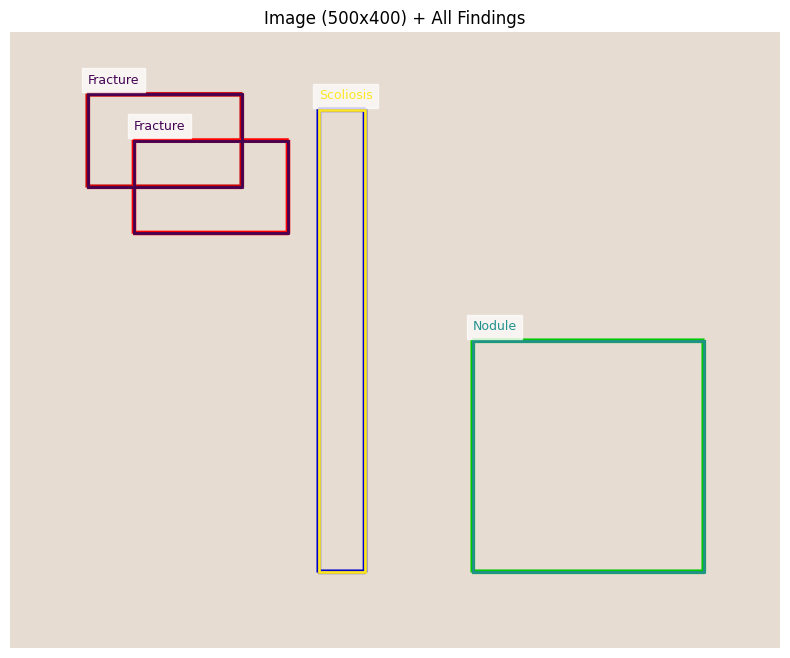

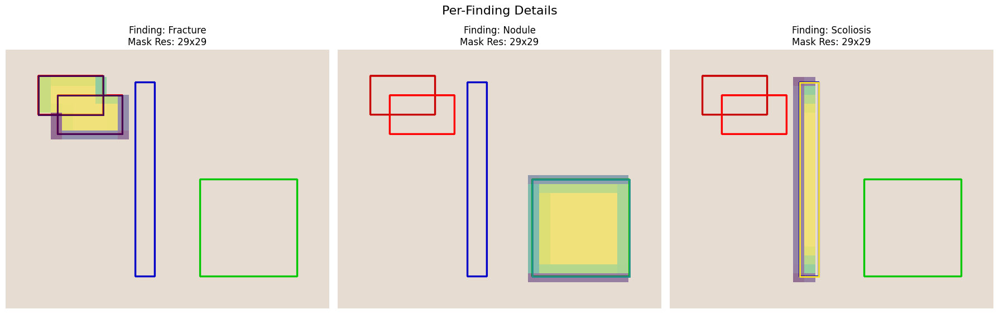

In [22]:
results_no_aug = visualize_augment_findings(
    dummy_image_path,
    classes,
    bboxes_all,
    precomputed_masks,
    final_resolution,
    apply_aug=False
)

In [24]:
img_no_aug, bboxes_no_aug, masks_no_aug = results_no_aug

In [27]:
bboxes_no_aug

[[[50, 40, 150, 100], [80, 70, 180, 130]],
 [[300, 200, 450, 350]],
 [[200, 50, 230, 350]]]

In [43]:
for x in ((masks_no_aug[2] > 0) + 0):
    print(x)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0

Generating a 600x400 image with 2 boxes...


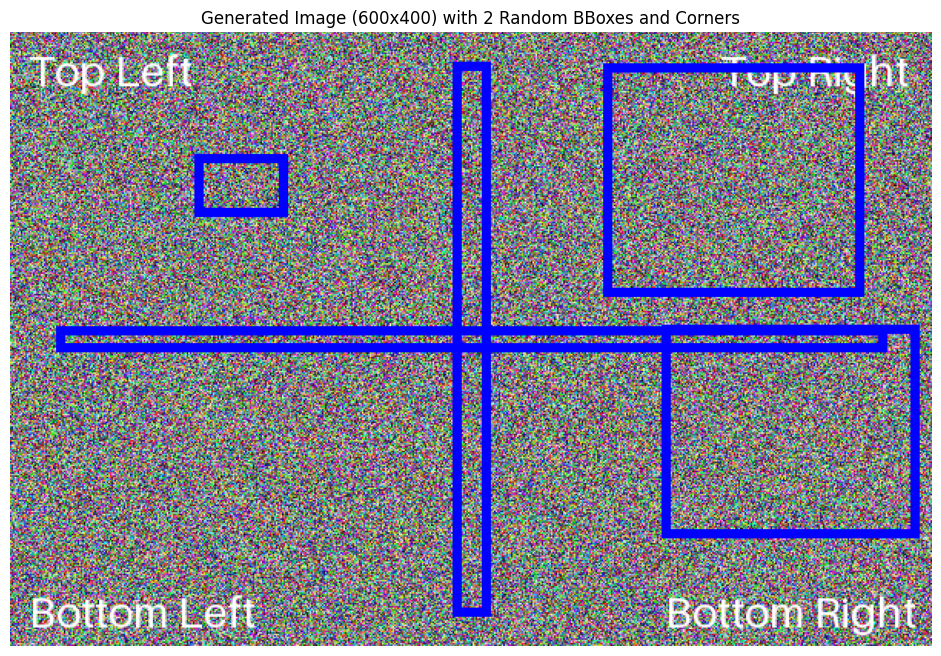


Returned image shape: (400, 600, 3)
Returned number of bounding boxes: 5
Example bounding box (normalized xyxy): [0.706912213795236, 0.47769662470436985, 0.9861494910798752, 0.8247544388057934]


In [447]:
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import random
from typing import Tuple, List

# Define type alias for clarity
BoundingBox = List[float] # Using list of floats for [x_min, y_min, x_max, y_max]

# def generate_random_bboxes_on_image(
#     H: int, W: int, N: int, min_size_ratio: float = 0.05, max_size_ratio: float = 0.5
# ) -> Tuple[np.ndarray, List[BoundingBox]]:
#     """
#     Generates a random image and places N random bounding boxes on it.

#     Creates an HxW image with random RGB noise as the background.
#     Generates N bounding boxes with random positions and sizes within the 
#     image boundaries. The size of the boxes is constrained by 
#     min/max_size_ratio relative to the image dimensions.
#     Draws the generated bounding boxes onto the image.
#     Visualizes the image with the bounding boxes using matplotlib.

#     Args:
#         H: Height of the image in pixels.
#         W: Width of the image in pixels.
#         N: Number of random bounding boxes to generate and draw.
#         min_size_ratio: Minimum width/height of a box as a fraction of W/H.
#         max_size_ratio: Maximum width/height of a box as a fraction of W/H.

#     Returns:
#         A tuple containing:
#         - image_with_boxes (np.ndarray): The generated HxWxC (RGB) image as a 
#           NumPy array (uint8) with the bounding boxes drawn on it.
#         - bboxes_normalized (List[BoundingBox]): A list of N bounding boxes. 
#           Each box is represented as [x_min, y_min, x_max, y_max] in 
#           normalized coordinates (range [0, 1]).
#     """
#     # 1. Generate random background image (RGB noise)
#     image_np = (np.random.rand(H, W, 3) * 255).astype(np.uint8)

#     # 2. Generate N random bounding boxes (normalized coordinates)
#     bboxes_normalized = []
#     min_w = W * min_size_ratio
#     min_h = H * min_size_ratio
#     max_w = W * max_size_ratio
#     max_h = H * max_size_ratio

#     for _ in range(N):
#         # Generate random width and height within constraints
#         box_w_px = random.uniform(min_w, max_w)
#         box_h_px = random.uniform(min_h, max_h)

#         # Generate random top-left corner (x_min, y_min) ensuring the box stays within bounds
#         x_min_px = random.uniform(0, W - box_w_px)
#         y_min_px = random.uniform(0, H - box_h_px)

#         # Calculate bottom-right corner
#         x_max_px = x_min_px + box_w_px
#         y_max_px = y_min_px + box_h_px

#         # Convert pixel coordinates to normalized coordinates [0, 1]
#         x_min_norm = x_min_px / W
#         y_min_norm = y_min_px / H
#         x_max_norm = x_max_px / W
#         y_max_norm = y_max_px / H
        
#         # Clamp values just in case of floating point inaccuracies
#         x_min_norm = max(0.0, min(1.0, x_min_norm))
#         y_min_norm = max(0.0, min(1.0, y_min_norm))
#         x_max_norm = max(0.0, min(1.0, x_max_norm))
#         y_max_norm = max(0.0, min(1.0, y_max_norm))

#         bboxes_normalized.append([x_min_norm, y_min_norm, x_max_norm, y_max_norm])
        
#     bboxes_normalized.append([0.2, 0.2, 0.3, 0.3])
#     bboxes_normalized.append([0.48, 0.05, 0.52, 0.95])
#     bboxes_normalized.append([0.05, 0.48, 0.95, 0.52])

#     # 3. Draw bounding boxes on the image using PIL
#     image_pil = Image.fromarray(image_np)
#     draw = ImageDraw.Draw(image_pil)
#     outline_color = "lime" # Use a bright color
#     # Scale line width slightly based on image size, minimum 1 pixel
#     line_width = max(1, int(min(H, W) * 0.005)) 

#     for bbox_norm in bboxes_normalized:
#         x_min_n, y_min_n, x_max_n, y_max_n = bbox_norm
#         # Convert normalized back to pixel coordinates for drawing
#         px_x_min = int(x_min_n * W)
#         px_y_min = int(y_min_n * H)
#         px_x_max = int(x_max_n * W)
#         px_y_max = int(y_max_n * H)

#         # Draw rectangle (PIL uses [ (x0, y0), (x1, y1) ])
#         draw.rectangle(
#             [(px_x_min, px_y_min), (px_x_max, px_y_max)],
#             outline=outline_color,
#             width=line_width
#         )

#     # Convert PIL image back to numpy array
#     image_with_boxes_np = np.array(image_pil)

#     # 4. Visualize the image with bounding boxes
#     plt.figure(figsize=(10, 10 * H / W)) # Adjust aspect ratio
#     plt.imshow(image_with_boxes_np)
#     plt.title(f"Generated Image ({W}x{H}) with {N} Random BBoxes")
#     plt.axis('off') # Hide axes ticks and labels
#     plt.tight_layout()
#     plt.show()

#     # 5. Return the image array (with boxes drawn) and the normalized bbox list
#     return image_with_boxes_np, bboxes_normalized


def generate_random_bboxes_on_image(
    H: int, W: int, N: int, min_size_ratio: float = 0.05, max_size_ratio: float = 0.5
) -> Tuple[np.ndarray, List[BoundingBox]]:
    """
    Generates a random image and places N random bounding boxes on it.

    Creates an HxW image with random RGB noise as the background.
    Generates N bounding boxes with random positions and sizes within the
    image boundaries. The size of the boxes is constrained by
    min/max_size_ratio relative to the image dimensions.
    Draws the generated bounding boxes onto the image.
    Visualizes the image with the bounding boxes using matplotlib.

    Args:
        H: Height of the image in pixels.
        W: Width of the image in pixels.
        N: Number of random bounding boxes to generate and draw.
        min_size_ratio: Minimum width/height of a box as a fraction of W/H.
        max_size_ratio: Maximum width/height of a box as a fraction of W/H.

    Returns:
        A tuple containing:
        - image_with_boxes (np.ndarray): The generated HxWxC (RGB) image as a
          NumPy array (uint8) with the bounding boxes drawn on it.
        - bboxes_normalized (List[BoundingBox]): A list of N bounding boxes.
          Each box is represented as [x_min, y_min, x_max, y_max] in
          normalized coordinates (range [0, 1]).
    """
    # 1. Generate random background image (RGB noise)
    image_np = (np.random.rand(H, W, 3) * 255).astype(np.uint8)

    # 2. Generate N random bounding boxes (normalized coordinates)
    bboxes_normalized = []
    min_w = W * min_size_ratio
    min_h = H * min_size_ratio
    max_w = W * max_size_ratio
    max_h = H * max_size_ratio

    for _ in range(N):
        # Generate random width and height within constraints
        box_w_px = random.uniform(min_w, max_w)
        box_h_px = random.uniform(min_h, max_h)

        # Generate random top-left corner (x_min, y_min) ensuring the box stays within bounds
        x_min_px = random.uniform(0, W - box_w_px)
        y_min_px = random.uniform(0, H - box_h_px)

        # Calculate bottom-right corner
        x_max_px = x_min_px + box_w_px
        y_max_px = y_min_px + box_h_px

        # Convert pixel coordinates to normalized coordinates [0, 1]
        x_min_norm = x_min_px / W
        y_min_norm = y_min_px / H
        x_max_norm = x_max_px / W
        y_max_norm = y_max_px / H

        # Clamp values just in case of floating point inaccuracies
        x_min_norm = max(0.0, min(1.0, x_min_norm))
        y_min_norm = max(0.0, min(1.0, y_min_norm))
        x_max_norm = max(0.0, min(1.0, x_max_norm))
        y_max_norm = max(0.0, min(1.0, y_max_norm))

        bboxes_normalized.append([x_min_norm, y_min_norm, x_max_norm, y_max_norm])

    # Add the specific bounding boxes you requested
    bboxes_normalized.append([0.2, 0.2, 0.3, 0.3])
    bboxes_normalized.append([0.48, 0.05, 0.52, 0.95])
    bboxes_normalized.append([0.05, 0.48, 0.95, 0.52])

    # 3. Draw texts and bounding boxes on the image using PIL
    image_pil = Image.fromarray(image_np)
    draw = ImageDraw.Draw(image_pil)

    # Define text labels and their approximate positions
    text_labels = {
        "Top Left": (int(W * 0.02), int(H * 0.02)),
        "Top Right": (int(W * 0.77), int(H * 0.02)),
        "Bottom Left": (int(W * 0.02), int(H * 0.9)),
        "Bottom Right": (int(W * 0.71), int(H * 0.9)),
    }
    text_color = (255, 255, 255)  # White color for text
    # Try to load a common font, fallback to default
    font_size = int(min(H, W) * 0.07)
    try:
        font = ImageFont.truetype("arial.ttf", font_size)
    except IOError:
        font = ImageFont.load_default(size=font_size)

    # Draw the text labels first
    for text, position in text_labels.items():
        draw.text(position, text, fill=text_color, font=font)

    # Now draw the bounding boxes
    outline_color = "blue"
    # Scale line width slightly based on image size, minimum 1 pixel
    line_width = max(1, int(min(H, W) * 0.015))

    for bbox_norm in bboxes_normalized:
        x_min_n, y_min_n, x_max_n, y_max_n = bbox_norm
        # Convert normalized back to pixel coordinates for drawing
        px_x_min = int(x_min_n * W)
        px_y_min = int(y_min_n * H)
        px_x_max = int(x_max_n * W)
        px_y_max = int(y_max_n * H)

        # Draw rectangle (PIL uses [ (x0, y0), (x1, y1) ])
        draw.rectangle(
            [(px_x_min, px_y_min), (px_x_max, px_y_max)],
            outline=outline_color,
            width=line_width
        )

    # Convert PIL image back to numpy array
    image_with_boxes_np = np.array(image_pil)

    # 4. Visualize the image with bounding boxes using matplotlib
    plt.figure(figsize=(10, 10 * H / W)) # Adjust aspect ratio
    plt.imshow(image_with_boxes_np)
    plt.title(f"Generated Image ({W}x{H}) with {N} Random BBoxes and Corners")
    plt.axis('off') # Hide axes ticks and labels
    plt.tight_layout()
    plt.show()

    # 5. Return the image array (with boxes drawn) and the normalized bbox list
    return image_with_boxes_np, bboxes_normalized

# --- Example Usage ---
if __name__ == "__main__":
    img_height = 400
    img_width = 600
    num_boxes = 2

    print(f"Generating a {img_width}x{img_height} image with {num_boxes} boxes...")
    
    generated_image, generated_bboxes = generate_random_bboxes_on_image(
        H=img_height, 
        W=img_width, 
        N=num_boxes,
        min_size_ratio=0.08, # Min box size 8% of image dimension
        max_size_ratio=0.4   # Max box size 40% of image dimension
    )

    print(f"\nReturned image shape: {generated_image.shape}")
    print(f"Returned number of bounding boxes: {len(generated_bboxes)}")
    if generated_bboxes:
        print("Example bounding box (normalized xyxy):", generated_bboxes[0])


In [387]:
from importlib import reload
import medvqa

In [333]:
reload(medvqa.utils.bbox_utils)

<module 'medvqa.utils.bbox_utils' from '/home/pamessina/medvqa/medvqa/utils/bbox_utils.py'>

In [388]:
from medvqa.utils.bbox_utils import (
    calculate_probabilistic_mask_from_bboxes,
    convert_bboxes_into_target_tensors,
    visualize_bbox_and_prob_mask_targets_tensors,
)

In [448]:
mask_resolution = (29, 29)
mask = calculate_probabilistic_mask_from_bboxes(generated_bboxes, mask_resolution)

In [397]:
import cv2
resized_mask = cv2.resize(mask, (12, 12), interpolation=cv2.INTER_AREA)

In [449]:
for x in (mask > 0) + 0:
    print(''.join([str(y) for y in x]))
print()
# for x in (resized_mask > 0) + 0:
#     print(''.join([str(y) for y in x]))

00000000000000000000000000000
00000000000001110011111111100
00000000000001110011111111100
00000000000001110011111111100
00000000000001110011111111100
00000111100001110011111111100
00000111100001110011111111100
00000111100001110011111111100
00000111100001110011111111100
00000000000001110011111111100
00000000000001110011111111100
00000000000001110011111111100
00000000000001110011111111100
01111111111111111111111111111
01111111111111111111111111111
01111111111111111111111111111
00000000000001110000111111111
00000000000001110000111111111
00000000000001110000111111111
00000000000001110000111111111
00000000000001110000111111111
00000000000001110000111111111
00000000000001110000111111111
00000000000001110000111111111
00000000000001110000000000000
00000000000001110000000000000
00000000000001110000000000000
00000000000001110000000000000
00000000000000000000000000000



Number of unique colors available: 20


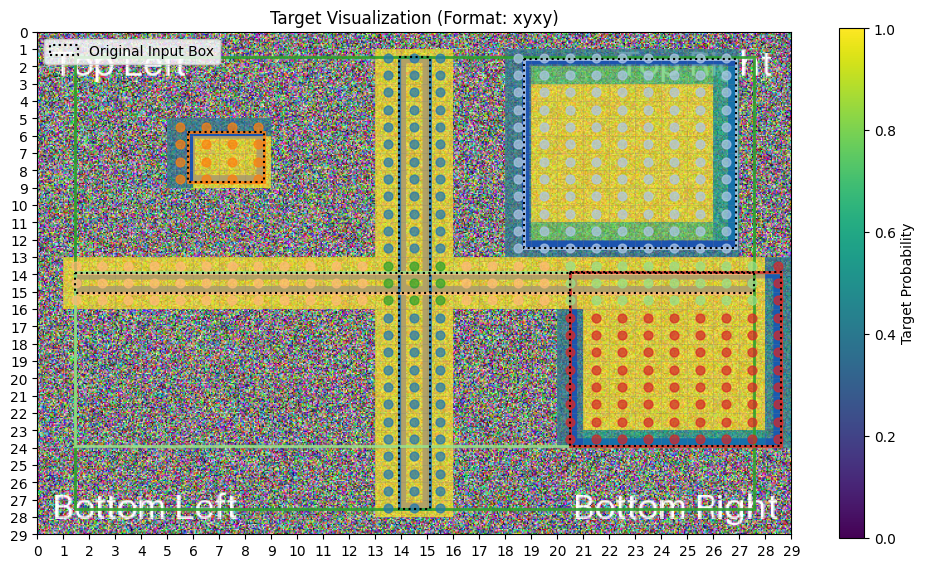


--- Output Tensors ---
Target Presence Shape: torch.Size([29, 29])
Target Coords Shape: torch.Size([29, 29, 4])


In [450]:
target_coords, target_presence, target_prob_mask = convert_bboxes_into_target_tensors(
    generated_bboxes,
    mask,
    mask.shape,
#     resized_mask,
#     resized_mask.shape,
)
input_bbox_format = "xyxy"

# --- Visualize the outputs ---
visualize_bbox_and_prob_mask_targets_tensors(
    background_image=generated_image,
    target_coords=target_coords,
    target_prob_mask=target_prob_mask,
    bbox_format="xyxy", # Pass the same format
    original_bboxes=generated_bboxes, # Pass original boxes for comparison
    title=f"Target Visualization (Format: {input_bbox_format})"
)

print("\n--- Output Tensors ---")
print("Target Presence Shape:", target_presence.shape)
# print("Target Presence:\n", target_presence) 
print("Target Coords Shape:", target_coords.shape)

Original Image shape: (256, 512, 3)
Original Bboxes: [[100, 100, 200, 200], [300, 50, 400, 150]]
Original Mask shape: (256, 512)

Augmented Image shape: (256, 512, 3)
Augmented Bboxes: [(456.70072400952733, 113.10999134394208, 466.86956227469256, 176.5874242886762), (207.83469117416874, 50.95624184818169, 341.8201677122605, 129.41193226172257)]
Augmented Mask shape: (256, 512)


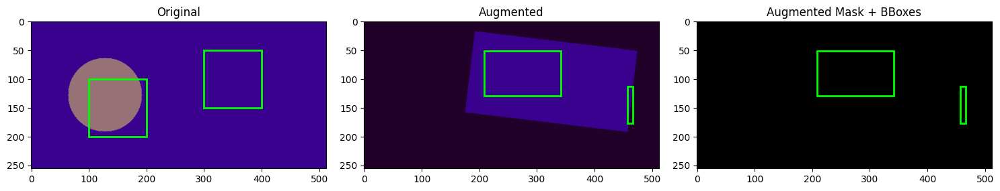

In [339]:
import cv2
import numpy as np
import albumentations as A
from typing import List, Tuple

def augment_image_bbox_mask(
    image: np.ndarray,
    bboxes: List[List[float]],
    mask: np.ndarray,
    bbox_format: str = 'pascal_voc', # e.g., 'pascal_voc', 'coco', 'yolo'
    flip_prob: float = 0.5,
    crop_prob: float = 0.5,
    affine_prob: float = 0.5,
    min_scale: float = 0.5, # For RandomScale
    shear_limit: int = 20, # For ShearX/ShearY
    rotate_limit: int = 20, # For Rotate
    translate_percent: float = 0.1, # For TranslateX/TranslateY
    interpolation: int = cv2.INTER_LINEAR,
    border_mode: int = cv2.BORDER_CONSTANT,
    always_apply: bool = False,
    p: float = 1.0, # Overall probability for the composition
) -> Tuple[np.ndarray, List[List[float]], np.ndarray]:
    """
    Applies a sequence of spatial random transformations (flip, crop, affine)
    to an image, its bounding boxes, and a segmentation mask using Albumentations.

    Args:
        image: Input image as a NumPy array (H, W, 3).
        bboxes: A list of bounding boxes. Each bbox is a list of floats.
                The format is specified by bbox_format.
                Example for 'pascal_voc': [[x_min, y_min, x_max, y_max], ...].
        mask: Input segmentation mask as a NumPy array (H, W). Expected to be
              binary or integer-valued where each integer represents a different
              segmentation class.
        bbox_format: The format of the bounding boxes. See albumentations
                     documentation for supported formats (e.g., 'pascal_voc',
                     'coco', 'yolo', 'albumentations'). Defaults to 'pascal_voc'.
        flip_prob: Probability of applying horizontal flipping.
        crop_prob: Probability of applying random crop.
        affine_prob: Probability of applying a set of affine transformations
                     (scale, shear, rotate, translate).
        min_scale: Minimum scaling factor for RandomScale affine.
        shear_limit: Limit for shear transformation in degrees.
        rotate_limit: Limit for rotation transformation in degrees.
        translate_percent: Maximum percentage of the image dimensions for
                           translation in TranslateX/TranslateY.
        interpolation: Interpolation method for transformations.
                       See cv2.INTER_ constants.
        border_mode: Pixel extrapolation method for transformations.
                     See cv2.BORDER_ constants.
        always_apply: Whether to always apply the augmentation pipeline
                      regardless of the 'p' parameter.
        p: Overall probability of applying the transformation composition.

    Returns:
        A tuple containing the augmented image, augmented bounding boxes,
        and augmented mask.
    """
    # Define the augmentation pipeline using Albumentations Compose
    transform = A.Compose(
        [
            A.HorizontalFlip(p=flip_prob),
            A.RandomSizedCrop(
                min_max_height=(int(image.shape[0] * 0.8), image.shape[0]), # Example range
                height=image.shape[0],
                width=image.shape[1],
                p=crop_prob
            ),
            A.ShiftScaleRotate(
                shift_limit_x=translate_percent,
                shift_limit_y=translate_percent,
                scale_limit=(-min_scale, 0.1), # Random scale between min_scale and 1.1
                rotate_limit=rotate_limit,
                interpolation=interpolation,
                border_mode=border_mode,
                p=affine_prob
            ),
            # You could add Shear here explicitly if you want more control,
            # but ShiftScaleRotate often handles basic scale/rotate/translate.
            # For explicit shear:
            # A.Affine(shear=shear_limit, interpolation=interpolation, border_mode=border_mode, p=affine_prob)

        ],
        bbox_params=A.BboxParams(
            format=bbox_format,
            label_fields=[], # No label fields needed if all bboxes are same class
                             # If classes were needed, add a list of labels here
        ),
        p=p, # Overall probability of applying this sequence
    )

    # Apply the transformations
    augmented = transform(image=image, bboxes=bboxes, mask=mask)

    # Extract augmented components
    augmented_image = augmented['image']
    augmented_bboxes = augmented['bboxes']
    augmented_mask = augmented['mask']

    return augmented_image, augmented_bboxes, augmented_mask

# Example Usage:
if __name__ == '__main__':
    # Create a dummy image (e.g., a red square on a blue background)
    img_height, img_width = 256, 512
    dummy_image = np.zeros((img_height, img_width, 3), dtype=np.uint8)
    dummy_image[:, :, 0] = 50  # Blue channel
    dummy_image[:, :, 2] = 200 # Red channel for the square area

    # Create a dummy bounding box (Pascal VOC format)
    # Representing a red square in the middle-right
    dummy_bboxes = [
        [100, 100, 200, 200], # x_min, y_min, x_max, y_max for a box
        [300, 50, 400, 150] # Another box
    ]

    # Create a dummy segmentation mask (e.g., a circle)
    dummy_mask = np.zeros((img_height, img_width), dtype=np.uint8)
    center_x, center_y = img_width // 4, img_height // 2
    radius = min(img_width, img_height) // 4
    cv2.circle(dummy_mask, (center_x, center_y), radius, 1, -1) # Draw a filled circle with value 1

    print("Original Image shape:", dummy_image.shape)
    print("Original Bboxes:", dummy_bboxes)
    print("Original Mask shape:", dummy_mask.shape)

    # Apply augmentation
    aug_image, aug_bboxes, aug_mask = augment_image_bbox_mask(
        image=dummy_image,
        bboxes=dummy_bboxes,
        mask=dummy_mask,
        bbox_format='pascal_voc', # Specify the format
        flip_prob=0.8,
        crop_prob=0.8,
        affine_prob=0.9,
        rotate_limit=45,
        translate_percent=0.2,
        p=1.0 # Always apply the composition in this example
    )

    print("\nAugmented Image shape:", aug_image.shape)
    print("Augmented Bboxes:", aug_bboxes)
    print("Augmented Mask shape:", aug_mask.shape)

    # Optional: Visualize the results
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches

    def draw_bboxes(ax, bboxes, format, color='lime', linewidth=2):
        """Helper to draw bounding boxes on an axes."""
        for bbox in bboxes:
            if format == 'pascal_voc':
                x_min, y_min, x_max, y_max = bbox
                rect = patches.Rectangle(
                    (x_min, y_min), x_max - x_min, y_max - y_min,
                    linewidth=linewidth, edgecolor=color, facecolor='none'
                )
            elif format == 'coco':
                x_min, y_min, width, height = bbox
                rect = patches.Rectangle(
                    (x_min, y_min), width, height,
                    linewidth=linewidth, edgecolor=color, facecolor='none'
                )
            # Add other formats if needed...
            else:
                raise ValueError(f"Unsupported bbox format for drawing: {format}")
            ax.add_patch(rect)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Original
    axes[0].imshow(dummy_image)
    draw_bboxes(axes[0], dummy_bboxes, 'pascal_voc')
    axes[0].imshow(dummy_mask, alpha=0.5, cmap='viridis') # Overlay mask
    axes[0].set_title("Original")

    # Augmented
    axes[1].imshow(aug_image)
    draw_bboxes(axes[1], aug_bboxes, 'pascal_voc') # Draw augmented bboxes
    axes[1].imshow(aug_mask, alpha=0.5, cmap='viridis') # Overlay augmented mask
    axes[1].set_title("Augmented")

    # Augmented Mask Only (for clearer view)
    axes[2].imshow(aug_mask, cmap='gray') # Or viridis if multiple mask values
    draw_bboxes(axes[2], aug_bboxes, 'pascal_voc') # Overlay augmented bboxes on mask
    axes[2].set_title("Augmented Mask + BBoxes")


    plt.tight_layout()
    plt.show()

In [340]:
dummy_bboxes

[[100, 100, 200, 200], [300, 50, 400, 150]]

In [451]:
generated_bboxes

[[0.706912213795236,
  0.47769662470436985,
  0.9861494910798752,
  0.8247544388057934],
 [0.6448715422130701,
  0.05354695405982524,
  0.9266309972663277,
  0.431386359503712],
 [0.2, 0.2, 0.3, 0.3],
 [0.48, 0.05, 0.52, 0.95],
 [0.05, 0.48, 0.95, 0.52]]

In [452]:
image_width = generated_image.shape[1] # Width of the generated image
image_height = generated_image.shape[0] # Height of the generated image
mask_height = mask.shape[0] # Height of the mask
mask_width = mask.shape[1] # Width of the mask

if mask_height != image_height or mask_width != image_width:
    mask_resized = cv2.resize(
        mask,
        (image_width, image_height), # Target size (width, height) for cv2.resize
        interpolation=cv2.INTER_LINEAR
    )
    print(f"Resized mask from {mask.shape} to {mask_resized.shape}")
else:
    mask_resized = mask # No resize needed

aug_image, aug_bboxes, aug_mask = augment_image_bbox_mask(
    image=generated_image,
    bboxes=generated_bboxes,
    mask=mask_resized,
    bbox_format='albumentations', # Specify the format
    flip_prob=0.8,
    crop_prob=0.8,
    affine_prob=0.9,
    rotate_limit=45,
    translate_percent=0.2,
    p=1.0 # Always apply the composition in this example
)

Resized mask from (29, 29) to (400, 600)


In [453]:
aug_mask_resized = cv2.resize(aug_mask, (29, 29), interpolation=cv2.INTER_LINEAR)

In [454]:
for x in (aug_mask_resized > 0) + 0:
    print(''.join([str(y) for y in x]))

00000000000000000000000000000
00000000000000000000000000000
00000000000000000000000000000
00000000000000000000000100000
00000000000000000000001110000
00000000000000000000111110000
00000000000000000001111100000
00000000000000000000111000100
00000000000000010000110001100
00000000000000111000100011110
00000000000011111000001111100
00000000000011111000011110000
00000000001101111100111100000
00000000011101111101111000000
00000000011101111111110000000
00000000011110111111000000000
00000000011110111110000000000
00000000001110111111000000000
00000000001111111111000000000
00000000001111111111000000000
00000000000111001111100000000
00000000000110001111100000000
00000000000110001111100000000
00000000000010000111110000000
00000000000010000111100000000
00000000000011000111000000000
00000000000001000010000000000
00000000000001000000000000000
00000000000000000000000000000


In [455]:
aug_bboxes

[(0.2871077501956465,
  0.42917382290683953,
  0.4201587174308603,
  0.6876438809535919),
 (0.7014340421006292,
  0.15048749883378312,
  0.8210122430867903,
  0.2918289612227013),
 (0.4662344038526968,
  0.30256679440370343,
  0.6977960203019355,
  0.8803458039649218),
 (0.3730002602398289,
  0.2710747078679644,
  0.9469152261495944,
  0.7448441147931196)]

In [465]:
fake_image = np.random.randint(0, 256, (40, 80, 3)).astype(np.uint8)

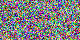

In [466]:
Image.fromarray(fake_image)

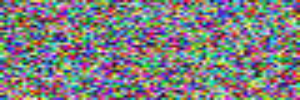

In [474]:
Image.fromarray(cv2.resize(fake_image, (300, 100), interpolation=cv2.INTER_LINEAR))

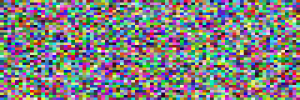

In [476]:
Image.fromarray(cv2.resize(fake_image, (300, 100), interpolation=cv2.INTER_AREA))

Number of unique colors available: 20


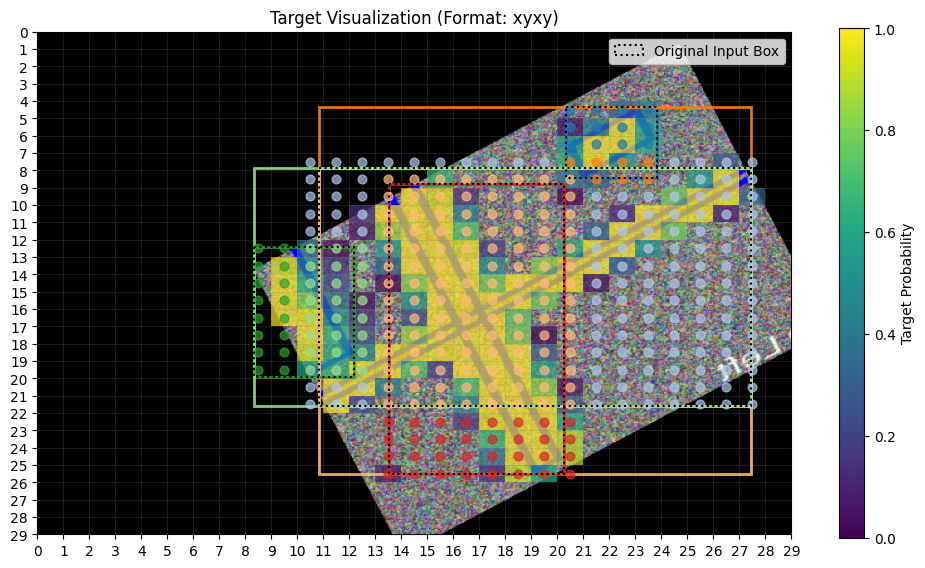


--- Output Tensors ---
Target Presence Shape: torch.Size([29, 29])
Target Coords Shape: torch.Size([29, 29, 4])


In [456]:
target_coords, target_presence, target_prob_mask = convert_bboxes_into_target_tensors(
    aug_bboxes,
    aug_mask_resized,
    aug_mask_resized.shape,
)
input_bbox_format = "xyxy"

# --- Visualize the outputs ---
visualize_bbox_and_prob_mask_targets_tensors(
    background_image=aug_image,
    target_coords=target_coords,
    target_prob_mask=target_prob_mask,
    bbox_format="xyxy",
    original_bboxes=aug_bboxes,
    title=f"Target Visualization (Format: {input_bbox_format})"
)

print("\n--- Output Tensors ---")
print("Target Presence Shape:", target_presence.shape)
# print("Target Presence:\n", target_presence) 
print("Target Coords Shape:", target_coords.shape)

Creating a dummy image 'example.jpg' for demonstration.


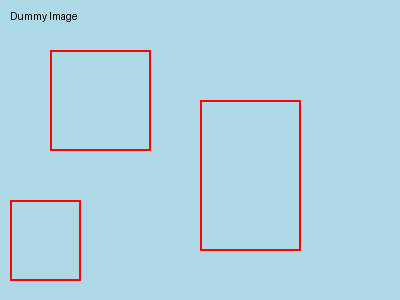

In [274]:
from PIL import Image, ImageDraw

def draw_bboxes_on_image(image_path, bboxes):
    """
    Loads an image, draws bounding boxes on it, and displays the result.

    Args:
        image_path (str): The path to the image file.
        bboxes (list): A list of bounding box coordinates. Each bounding box
                       should be a tuple or list of four integers representing
                       (x_min, y_min, x_max, y_max).
    """
    try:
        # Open the image
        img = Image.open(image_path)
        draw = ImageDraw.Draw(img)

        # Draw each bounding box
        for bbox in bboxes:
            # Ensure the bounding box format is correct
            if len(bbox) == 4:
                x_min, y_min, x_max, y_max = bbox
                # Draw the rectangle with a red outline
                draw.rectangle([(x_min, y_min), (x_max, y_max)], outline="red", width=2)
            else:
                print(f"Warning: Invalid bounding box format: {bbox}. Skipping.")

        # Display the image
        img.show()

    except FileNotFoundError:
        print(f"Error: Image file not found at {image_path}")
    except Exception as e:
        print(f"An error occurred: {e}")

if __name__ == '__main__':
    # Example Usage:
    # Create a dummy image for demonstration if you don't have one
    try:
        # Try to open a file named 'example.jpg' first
        img = Image.open('example.jpg')
    except FileNotFoundError:
        # If not found, create a dummy image
        print("Creating a dummy image 'example.jpg' for demonstration.")
        dummy_img = Image.new('RGB', (400, 300), color = 'lightblue')
        dummy_draw = ImageDraw.Draw(dummy_img)
        dummy_draw.text((10, 10), "Dummy Image", fill="black")
        dummy_img.save('example.jpg')

    # Define a list of bounding boxes
    example_bboxes = [
        (50, 50, 150, 150),  # Example bbox 1
        (200, 100, 300, 250), # Example bbox 2
        (10, 200, 80, 280)   # Example bbox 3
    ]

    # Call the function to draw bboxes on the image
    draw_bboxes_on_image('example.jpg', example_bboxes)

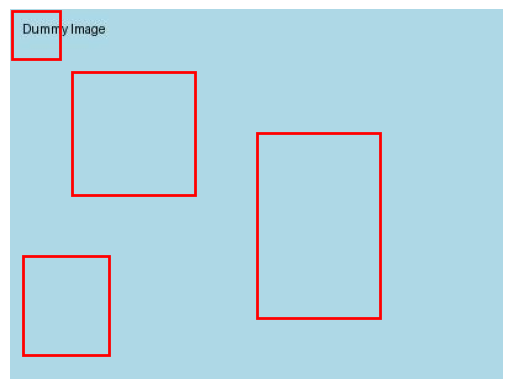

In [276]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image # Still using PIL to load the image

def draw_bboxes_on_image_matplotlib(image_path, bboxes):
    """
    Loads an image, draws bounding boxes on it using Matplotlib, and displays the result.

    Args:
        image_path (str): The path to the image file.
        bboxes (list): A list of bounding box coordinates. Each bounding box
                       should be a tuple or list of four integers representing
                       (x_min, y_min, x_max, y_max).
    """
    try:
        # Open the image using PIL
        img = Image.open(image_path)

        # Create a Matplotlib figure and axes
        fig, ax = plt.subplots(1)

        # Display the image on the axes
        ax.imshow(img)

        # Draw each bounding box
        for bbox in bboxes:
            # Ensure the bounding box format is correct
            if len(bbox) == 4:
                x_min, y_min, x_max, y_max = bbox
                # Create a Rectangle patch
                rect = patches.Rectangle(
                    (x_min, y_min),  # (x, y) of bottom-left corner
                    x_max - x_min,   # width
                    y_max - y_min,   # height
                    linewidth=2,
                    edgecolor='red',
                    facecolor='none' # No fill color
                )
                # Add the patch to the axes
                ax.add_patch(rect)
            else:
                print(f"Warning: Invalid bounding box format: {bbox}. Skipping.")

        # Remove the axis ticks and labels for a cleaner look
        ax.set_axis_off()

        # Display the plot
        plt.show()

    except FileNotFoundError:
        print(f"Error: Image file not found at {image_path}")
    except Exception as e:
        print(f"An error occurred: {e}")

if __name__ == '__main__':
    # Example Usage:
    # Create a dummy image for demonstration if you don't have one
    try:
        # Try to open a file named 'example.jpg' first
        img = Image.open('example.jpg')
    except FileNotFoundError:
        # If not found, create a dummy image
        print("Creating a dummy image 'example.jpg' for demonstration.")
        dummy_img = Image.new('RGB', (400, 300), color = 'lightblue')
        dummy_draw = ImageDraw.Draw(dummy_img)
        dummy_draw.text((10, 10), "Dummy Image", fill="black")
        dummy_img.save('example.jpg')
        from PIL import ImageDraw # Import again for dummy image creation

    # Define a list of bounding boxes
    example_bboxes = [
        (1, 1, 40, 40),
        (50, 50, 150, 150),  # Example bbox 1
        (200, 100, 300, 250), # Example bbox 2
        (10, 200, 80, 280)   # Example bbox 3
    ]

    # Call the function to draw bboxes on the image using Matplotlib
    draw_bboxes_on_image_matplotlib('example.jpg', example_bboxes)
